In [307]:
import numpy as np
import matplotlib.pyplot as plt
import cv2 as cv
import os
from skimage import data, io, filters, feature, color
from skimage.measure import find_contours, approximate_polygon, subdivide_polygon
from skimage import img_as_ubyte
from scipy import ndimage as ndi
from PIL import Image





#2
csvFile = open("GTI770_label_data_set.csv", "r")
countTotal = 0
countSmooth = 0
countSpiral = 0
nbImages = 100
img_h = 424
img_w = 424
crop_value = 100

X = np.zeros((nbImages, 3, img_h, img_w),dtype=np.uint8) # matrice X de la forme (nombre d'image, nombre de canaux(RGB), hauteur, largeur)
Y = np.zeros((nbImages, 1), 'U6')     # matrice Y de la forme (nombre d'image, la classe)

def prepareImg(imagePath, countTotal):
    img = cv2.imread(imagePath)
    img = img.reshape(3, img_h, img_w)
    X[countTotal] = img        # ajouter l'image dans la matrice X
    Y[countTotal] = imageClass # ajouter sa classe dans la matrice Y
    #print(countTotal, ": preparing "+imagePath)
        

for i in csvFile:
    imageId, imageClass = i.split(',')
    imageClass = imageClass[0:6]
    if imageId != "id":
        imagePath = './images_training/' + imageId + '.jpg'
        
        if imageClass == "smooth" : # si la classe de l'image est 'smooth'
            if countSmooth == nbImages/2 :  # s'il y a 50 image de cette classe
                continue            # passe a la prochaine image
            countSmooth += 1
        elif imageClass == "spiral" :
            if countSpiral == nbImages/2 :
                continue
            countSpiral += 1
        else :
            continue
        if not os.path.exists(imagePath):
            continue
        #
        
        #img = simple_threshold(img, threshold=10)
        prepareImg(imagePath, countTotal)
        countTotal += 1
   
        if countTotal == nbImages: # arrete a nbImages images totales (50 de chaque classe)
            print("smooth", countSmooth)
            print("spiral", countSpiral)
            break
            


smooth 50
spiral 50


In [315]:
def cropImages(matrix, crop_val):
    len = matrix.shape[0]
    print("cropping",len,"images to",crop_val)
    X_train_crop = np.zeros((len, 3, crop_val, crop_val), dtype=np.uint8)
    for i in range(0,len):
        image = matrix[i].reshape(img_h, img_w, 3)
        image = image[424 // 2 - crop_val // 2 : 424 // 2 + crop_val // 2, 424 // 2 - crop_val // 2 : 424 // 2 + crop_val // 2] # garder 25 de chaque cote depuis le milieu, pour chaque axe
        image = image.reshape(3, crop_val, crop_val)
        X_train_crop[i] = image
    return X_train_crop

x_cropped = cropImages(X, 200)

cropping 100 images to 200


len 100
image 1
139
corners 9


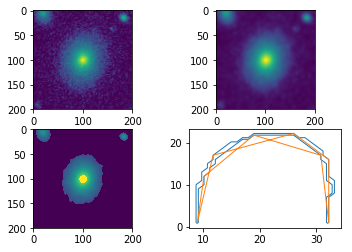

65
corners 5


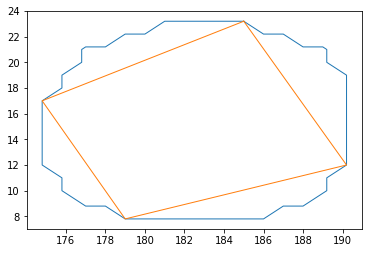

57
corners 5


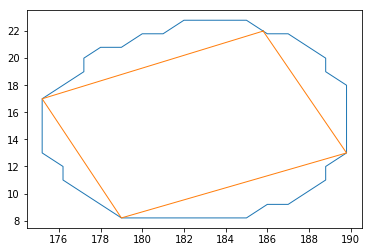

355
corners 13


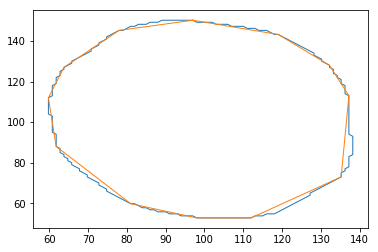

347
corners 12


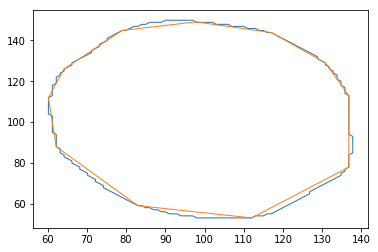

93
corners 8


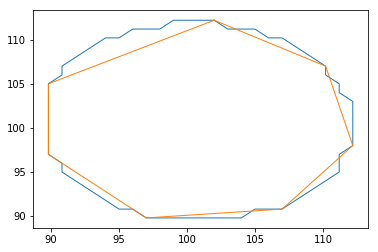

85
corners 9


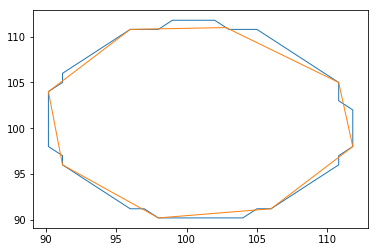

image 2
67
corners 6


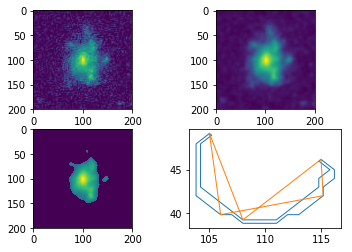

567
corners 21


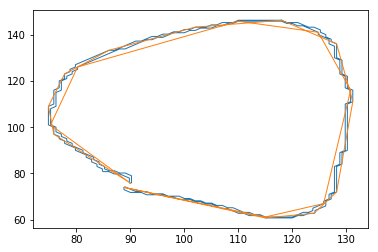

93
corners 6


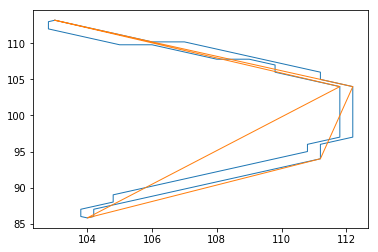

89
corners 6


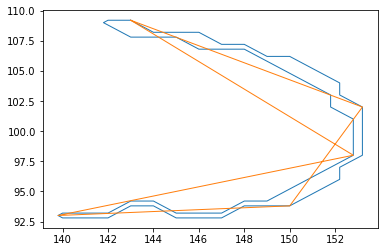

image 3
359
corners 10


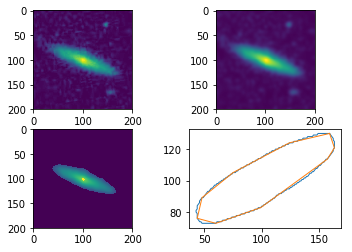

351
corners 10


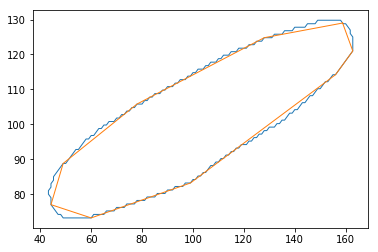

image 4
387
corners 16


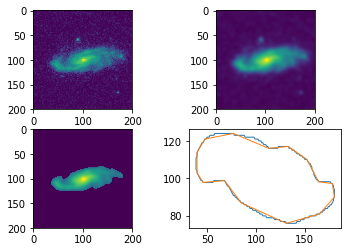

379
corners 16


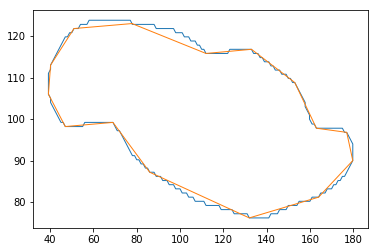

29
corners 3


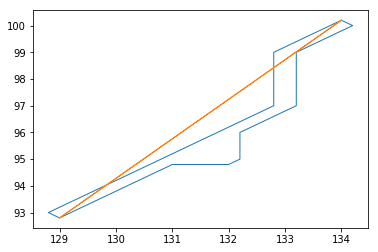

image 5
67
corners 5


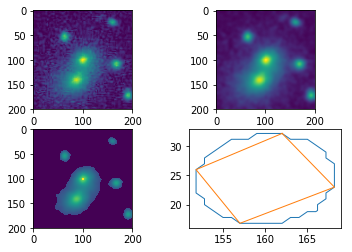

59
corners 5


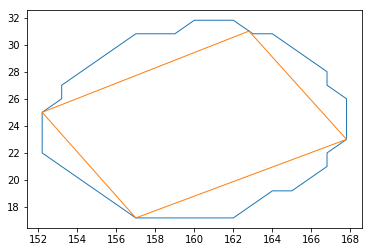

77
corners 6


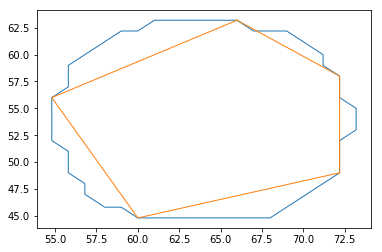

69
corners 6


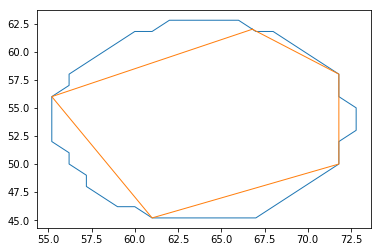

365
corners 12


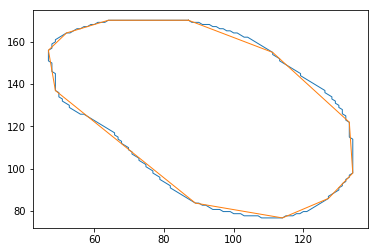

357
corners 11


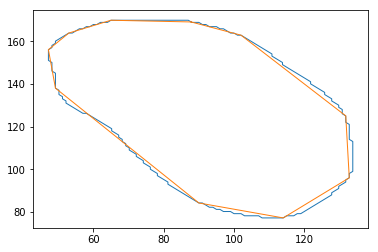

113
corners 9


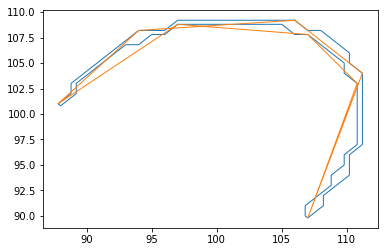

83
corners 7


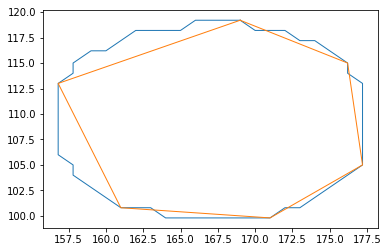

75
corners 6


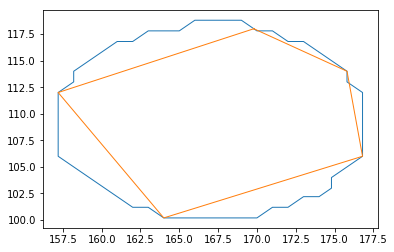

137
corners 10


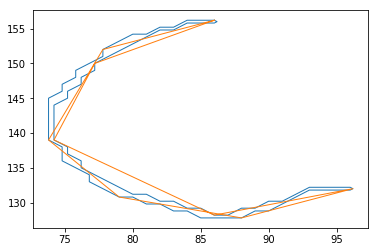

23
corners 4


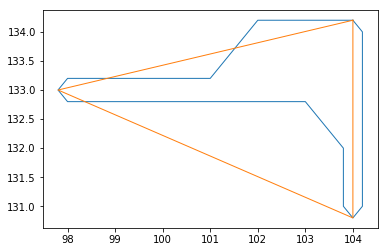

101
corners 8


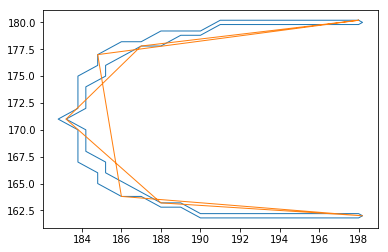

image 6
1153
corners 36


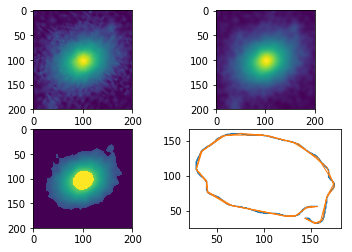

39
corners 3


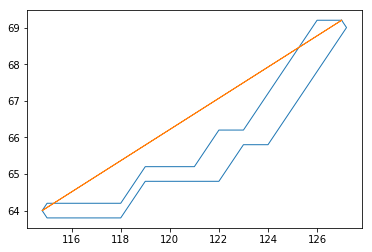

183
corners 9


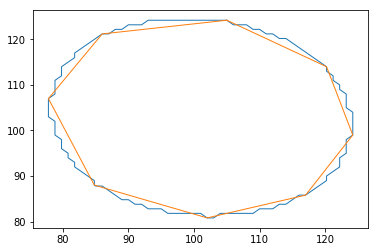

175
corners 9


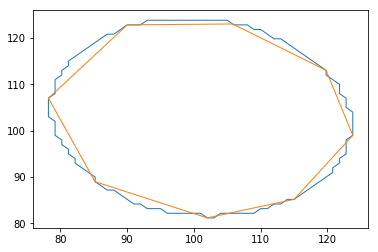

29
corners 4


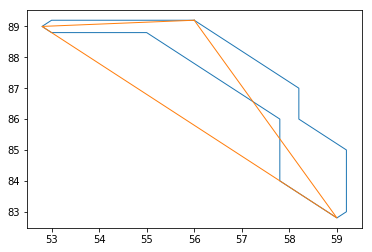

25
corners 3


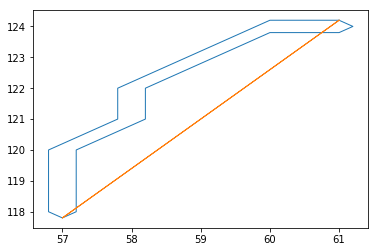

image 7
387
corners 13


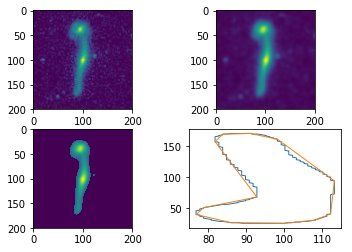

379
corners 13


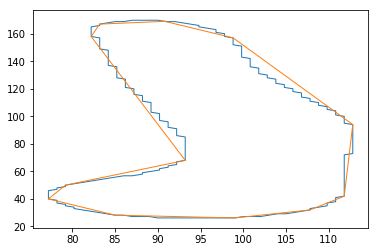

21
corners 3


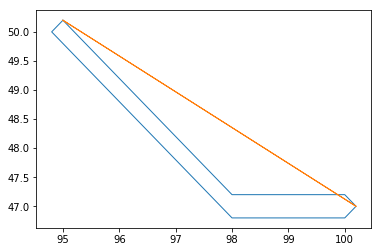

image 8
21
corners 3


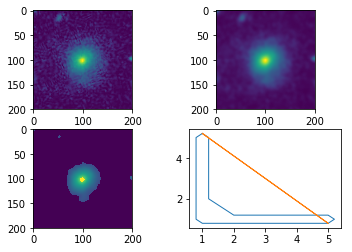

57
corners 5


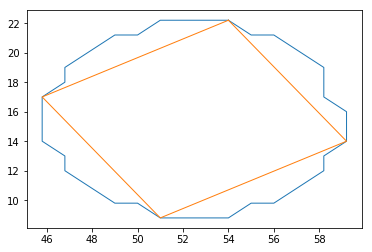

49
corners 5


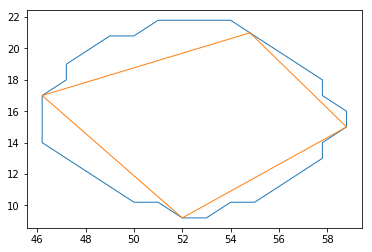

275
corners 9


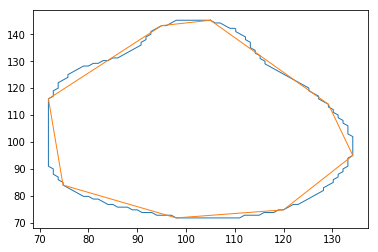

267
corners 9


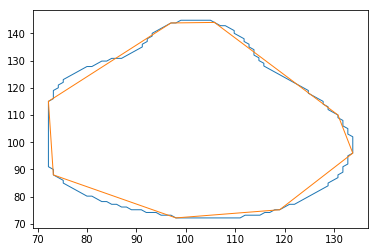

89
corners 7


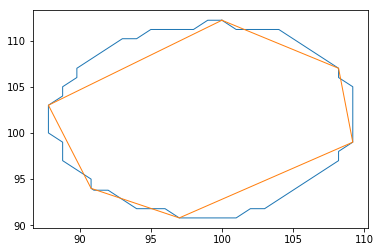

81
corners 6


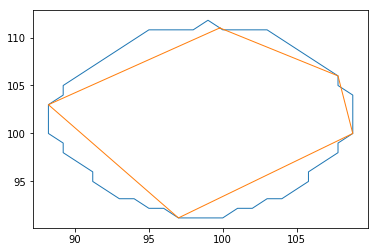

37
corners 3


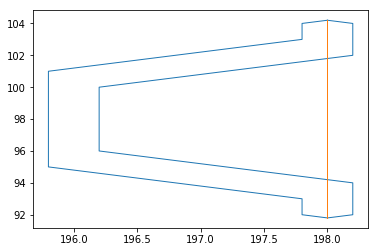

image 9
53
corners 5


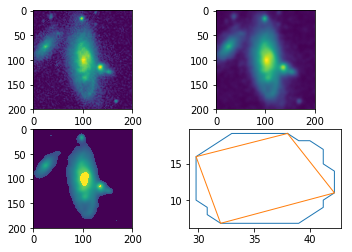

45
corners 5


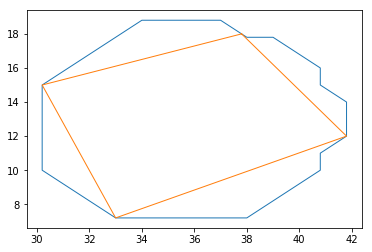

1029
corners 33


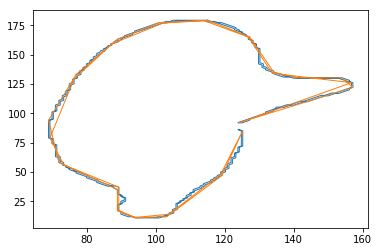

411
corners 16


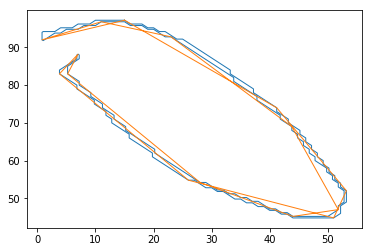

53
corners 3


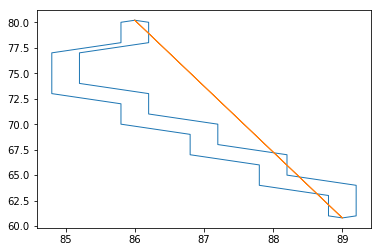

23
corners 3


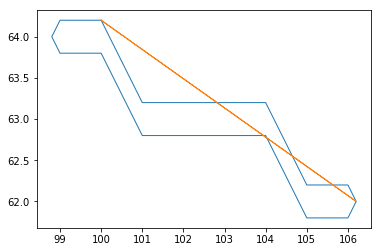

147
corners 9


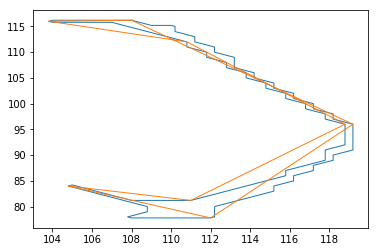

111
corners 9


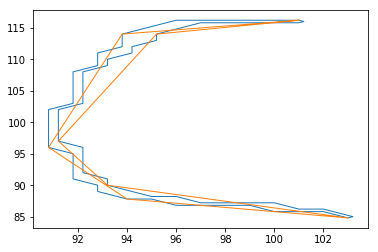

59
corners 5


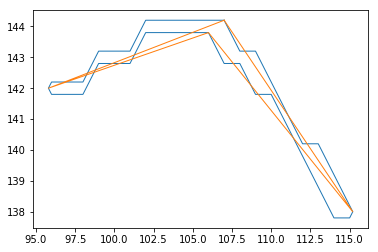

53
corners 5


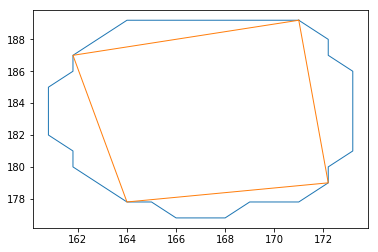

45
corners 5


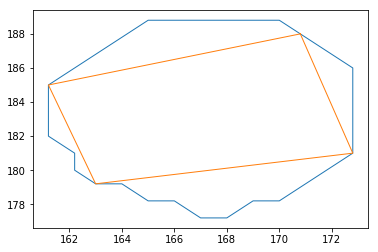

image 10
551
corners 16


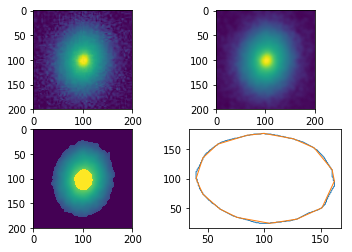

543
corners 17


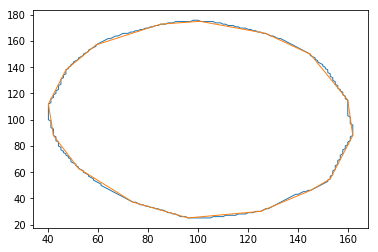

175
corners 9


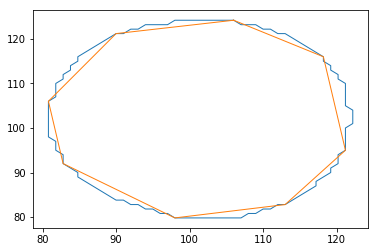

167
corners 9


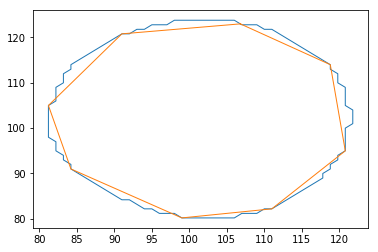

39
corners 4


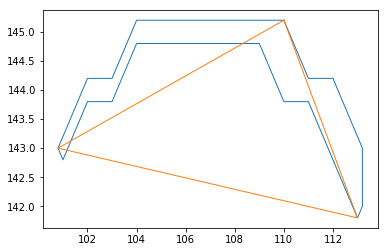

image 11
271
corners 10


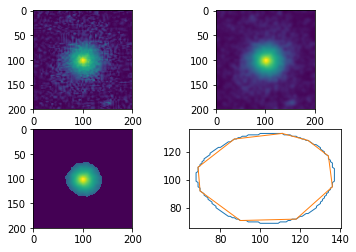

263
corners 10


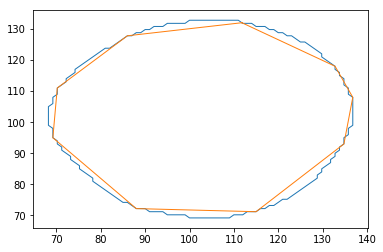

113
corners 7


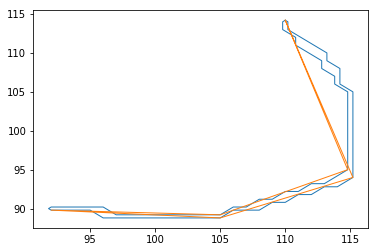

image 12
417
corners 15


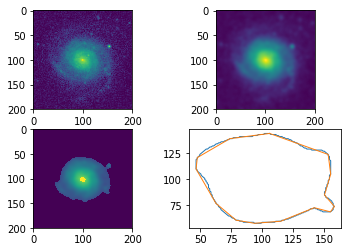

409
corners 14


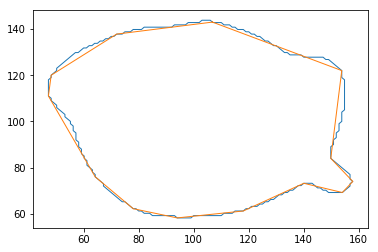

21
corners 3


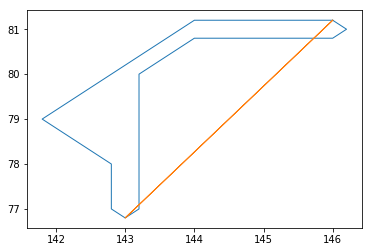

95
corners 7


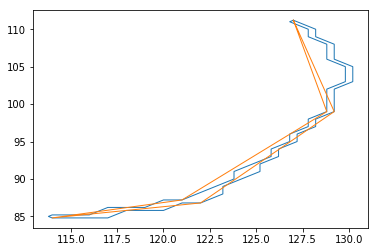

91
corners 7


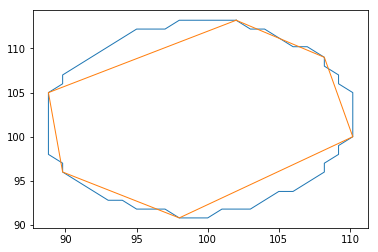

83
corners 7


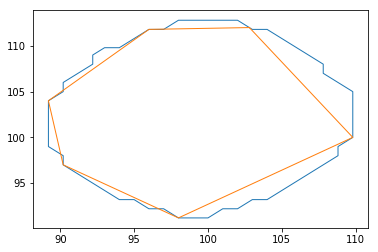

image 13
671
corners 26


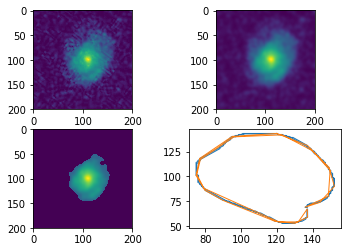

65
corners 5


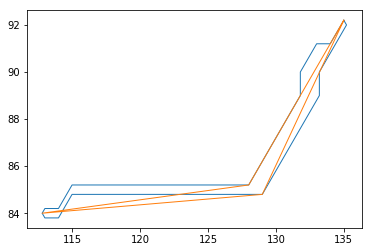

97
corners 5


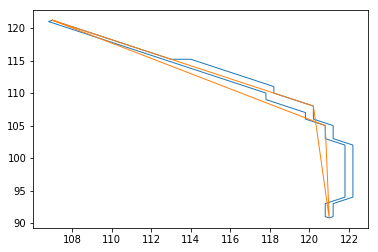

49
corners 3


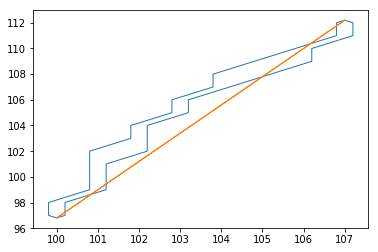

image 14
55
corners 6


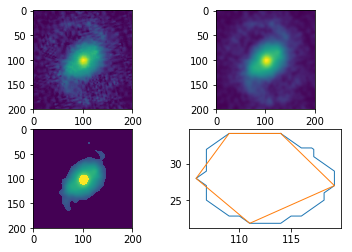

47
corners 6


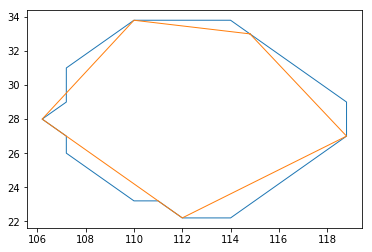

103
corners 8


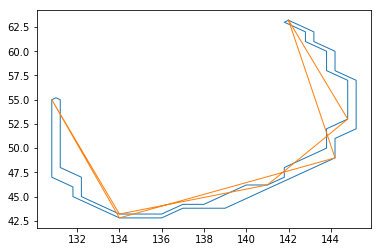

385
corners 15


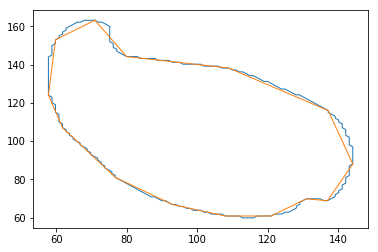

375
corners 14


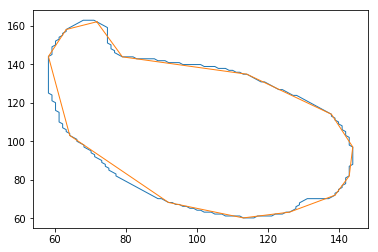

105
corners 9


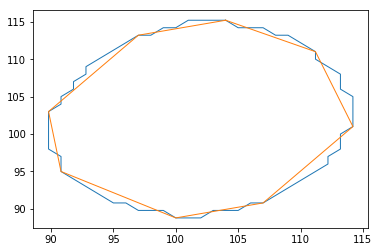

97
corners 7


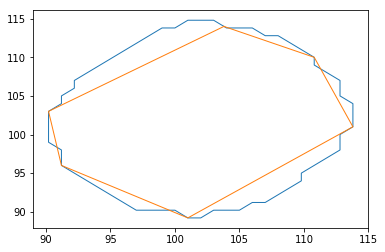

31
corners 3


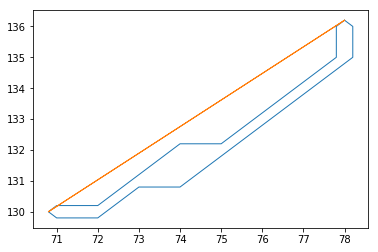

image 15
303
corners 10


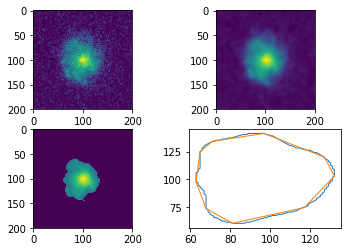

295
corners 10


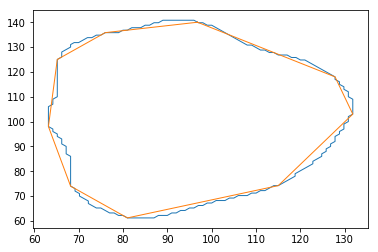

115
corners 7


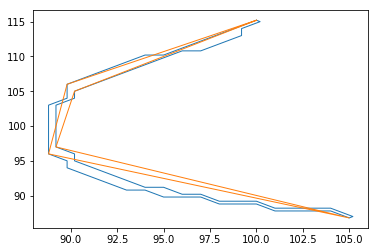

image 16
647
corners 19


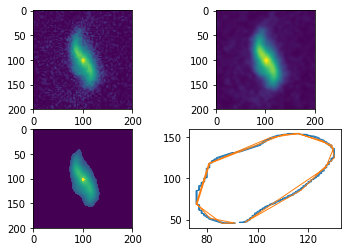

image 17
63
corners 5


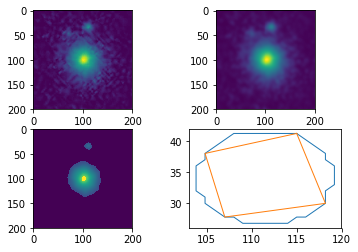

55
corners 5


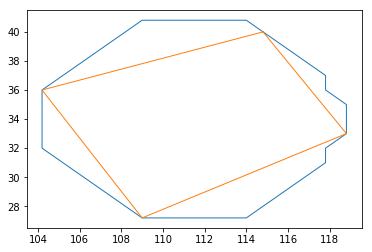

257
corners 10


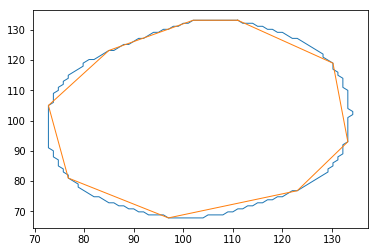

249
corners 11


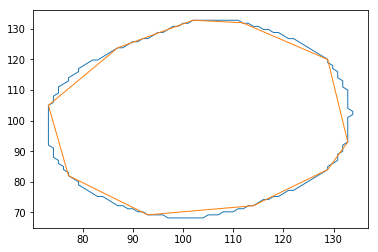

89
corners 7


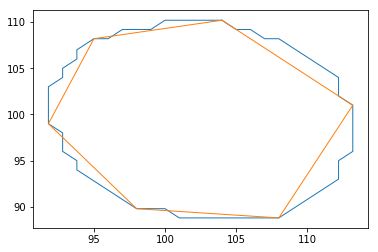

81
corners 7


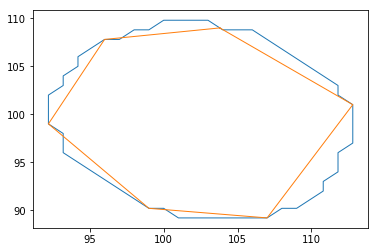

image 18
399
corners 12


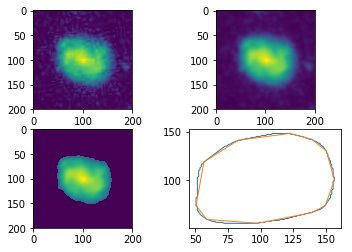

391
corners 13


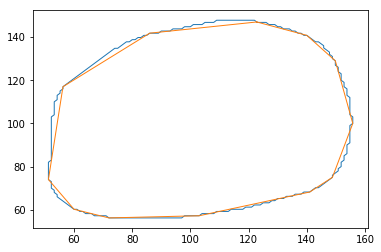

55
corners 4


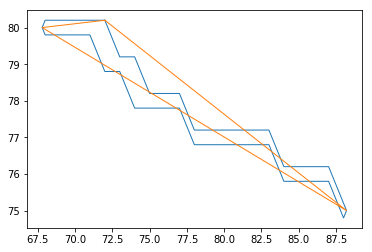

71
corners 5


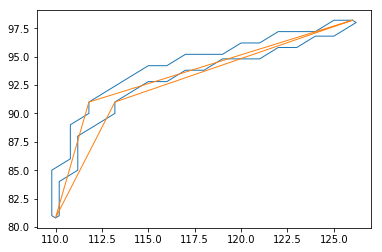

83
corners 3


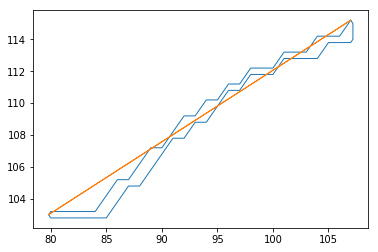

23
corners 3


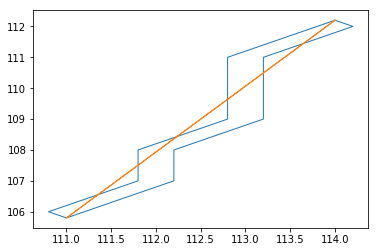

image 19
925
corners 30


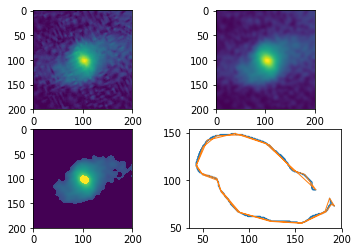

27
corners 4


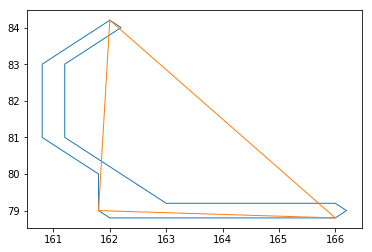

27
corners 3


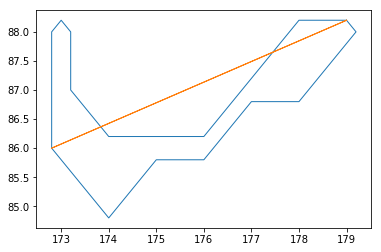

83
corners 4


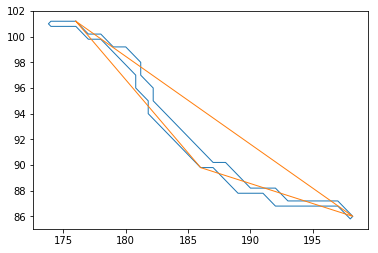

95
corners 7


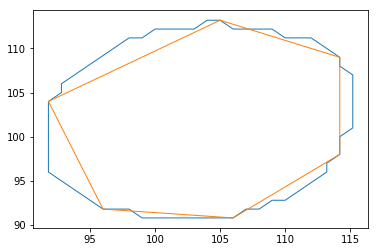

87
corners 7


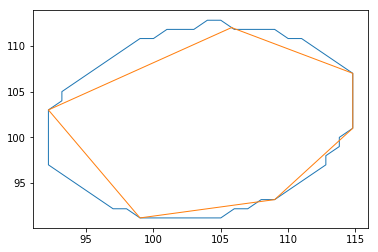

image 20
243
corners 10


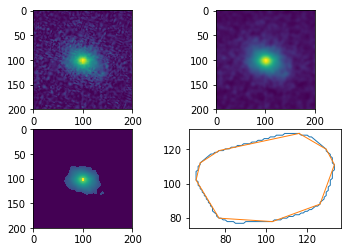

235
corners 9


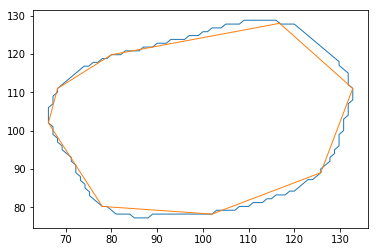

157
corners 12


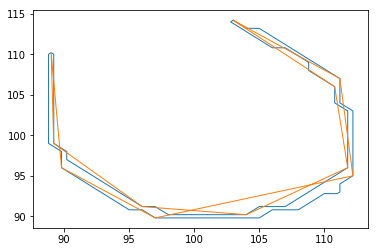

41
corners 5


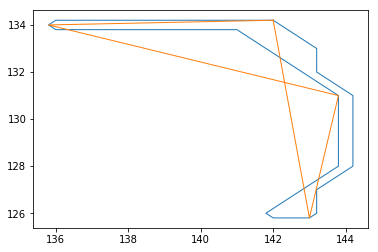

image 21
477
corners 13


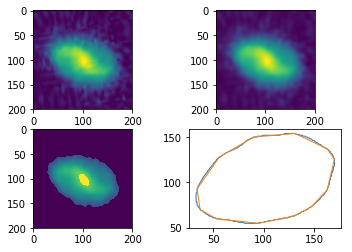

469
corners 14


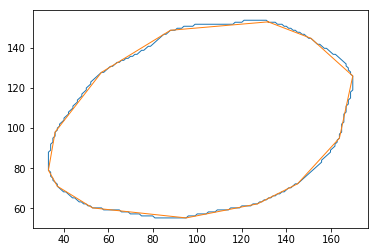

47
corners 3


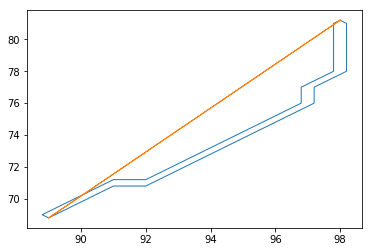

207
corners 12


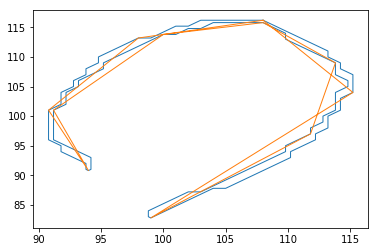

35
corners 3


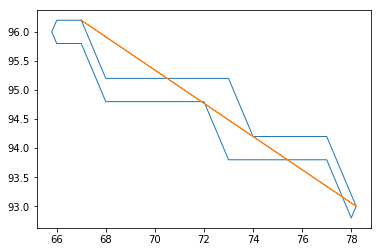

47
corners 3


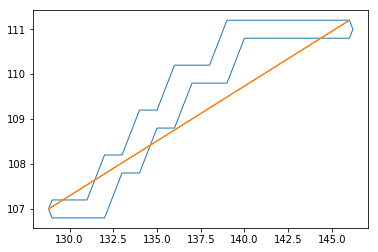

37
corners 3


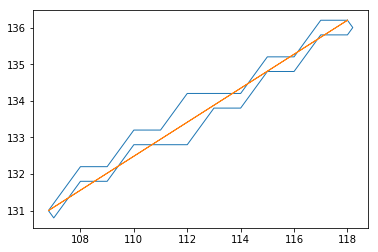

image 22
607
corners 18


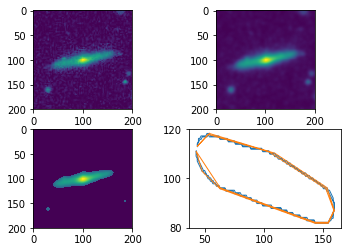

55
corners 5


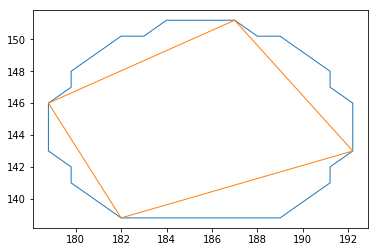

47
corners 5


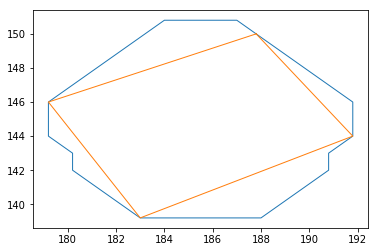

55
corners 5


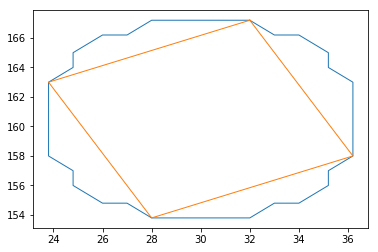

47
corners 5


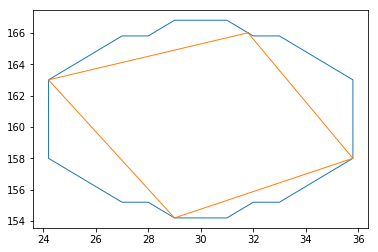

image 23
375
corners 12


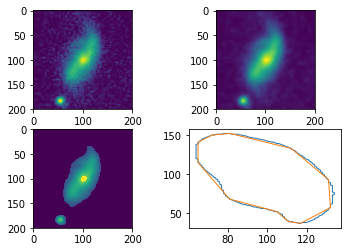

367
corners 11


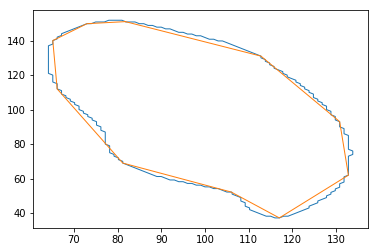

129
corners 7


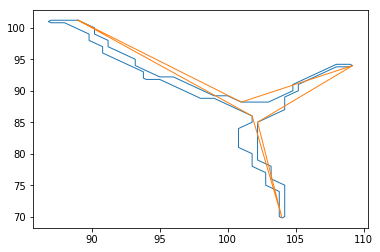

81
corners 5


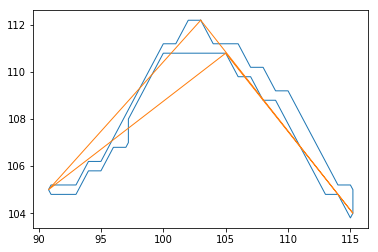

73
corners 6


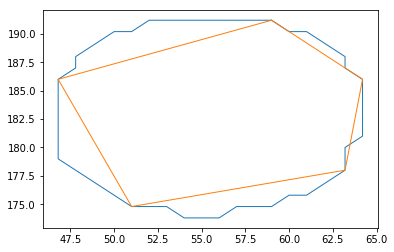

65
corners 6


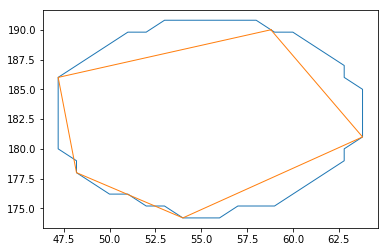

image 24
439
corners 16


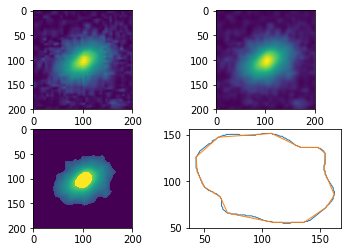

431
corners 15


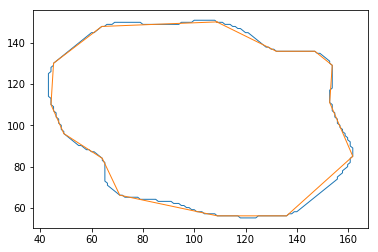

159
corners 9


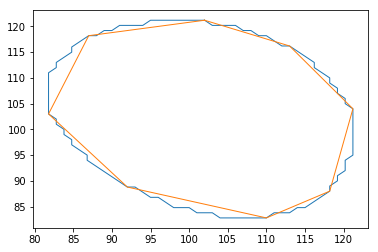

151
corners 9


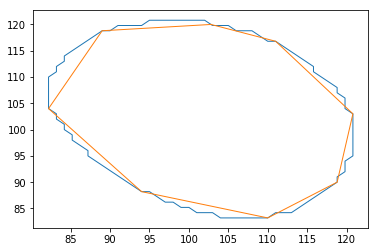

image 25
265
corners 9


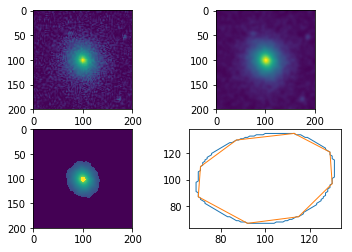

257
corners 9


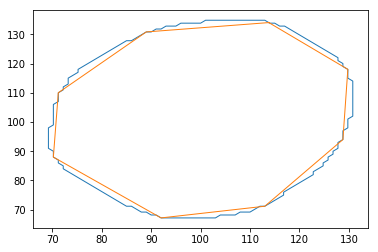

87
corners 8


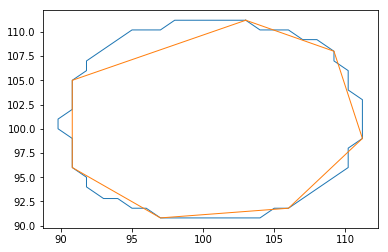

79
corners 7


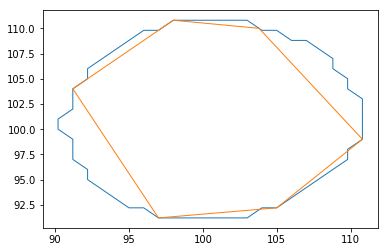

image 26
105
corners 8


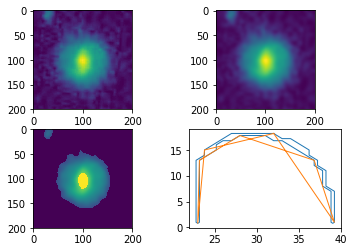

427
corners 13


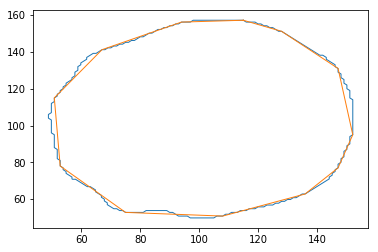

419
corners 13


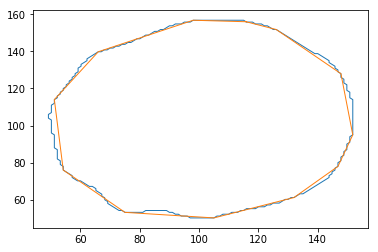

29
corners 3


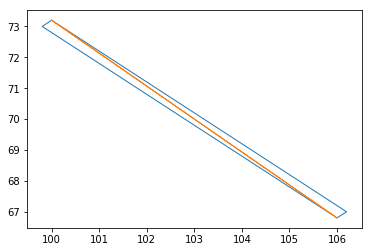

247
corners 17


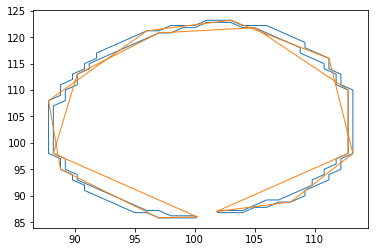

image 27
349
corners 12


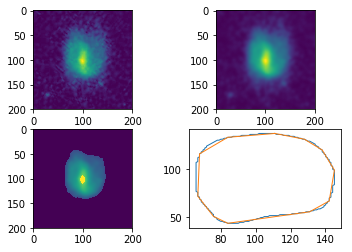

341
corners 12


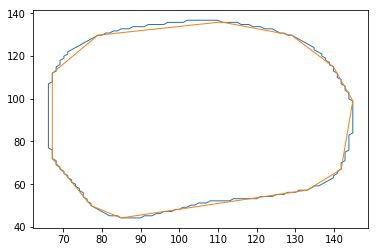

59
corners 3


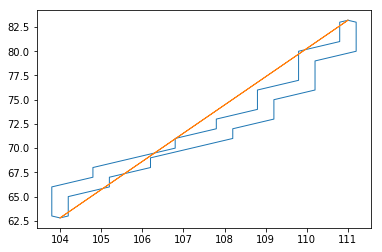

77
corners 5


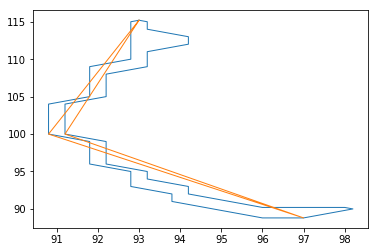

73
corners 5


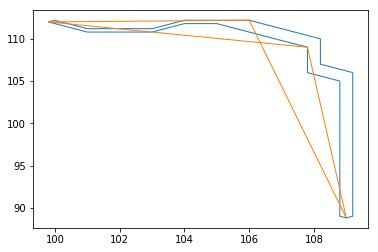

image 28
301
corners 12


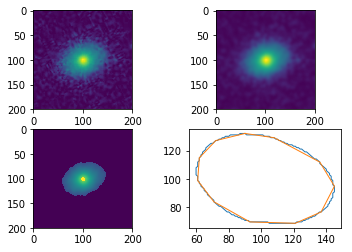

293
corners 12


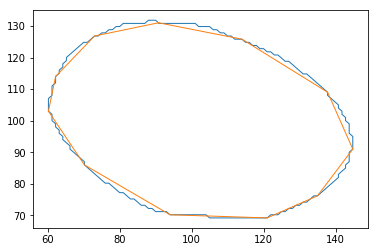

91
corners 8


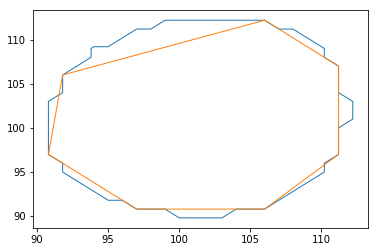

83
corners 7


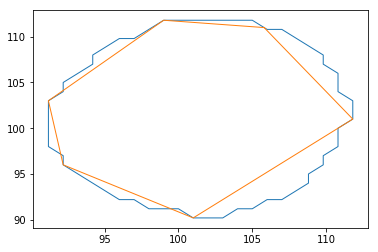

image 29
87
corners 5


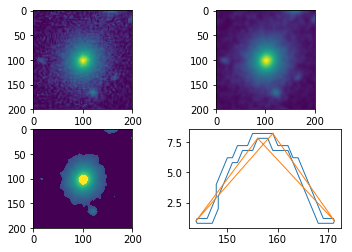

31
corners 3


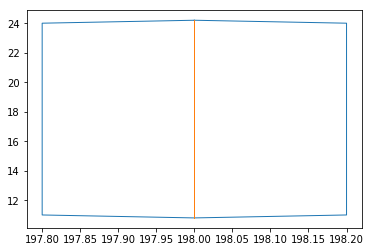

897
corners 31


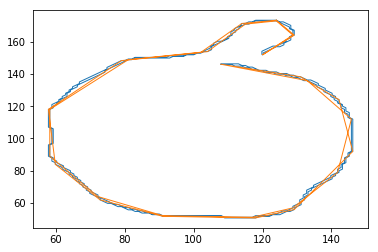

105
corners 7


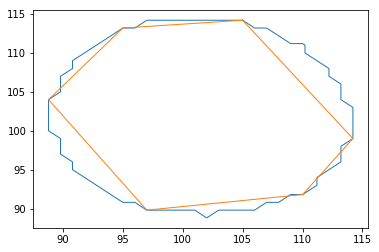

97
corners 7


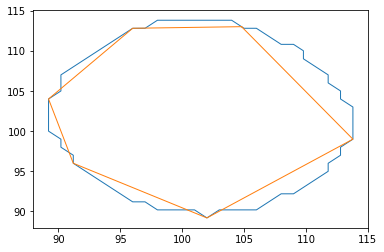

53
corners 5


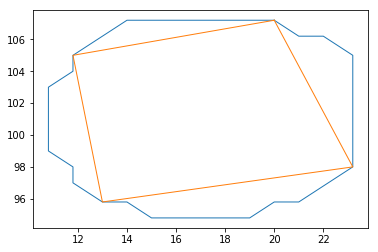

45
corners 5


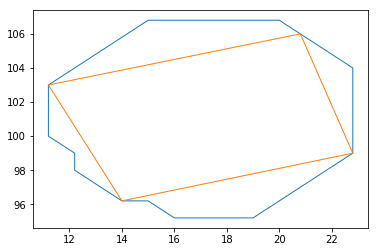

51
corners 5


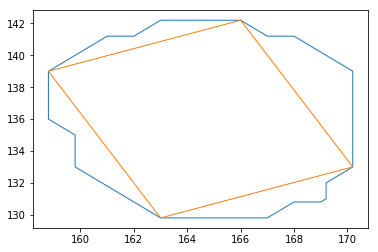

43
corners 5


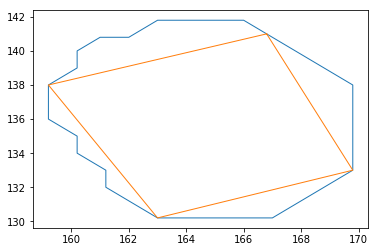

image 30
321
corners 10


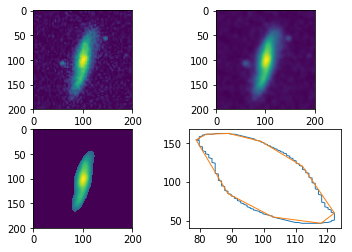

311
corners 11


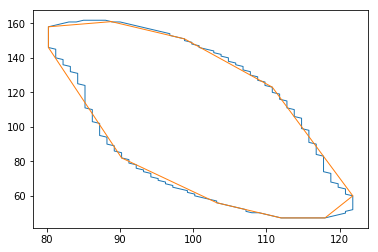

image 31
107
corners 9


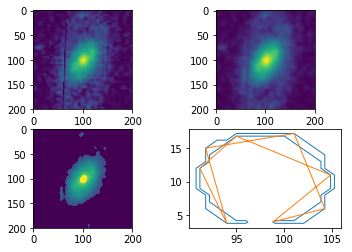

63
corners 5


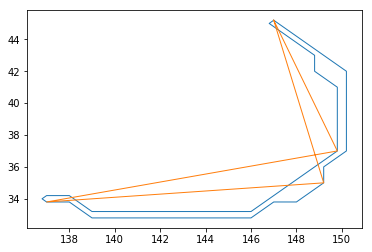

295
corners 9


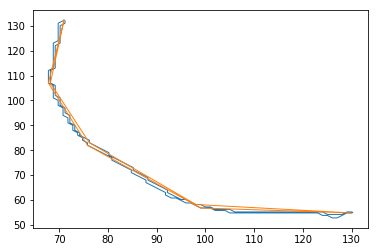

475
corners 20


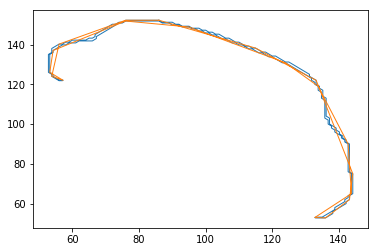

65
corners 4


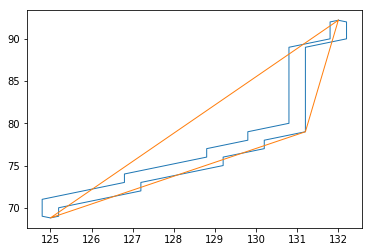

95
corners 6


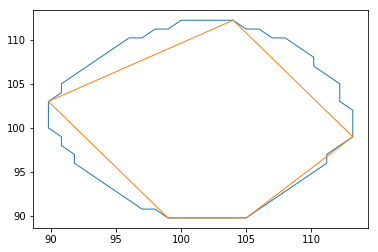

87
corners 5


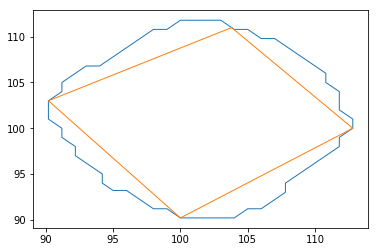

61
corners 5


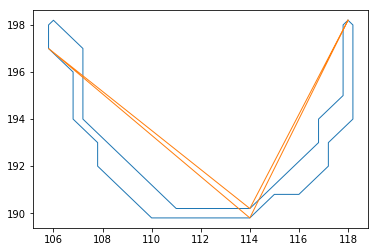

image 32
353
corners 11


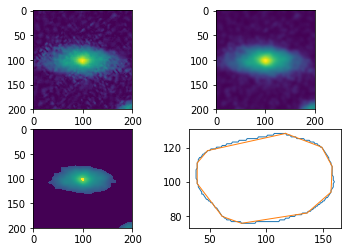

343
corners 11


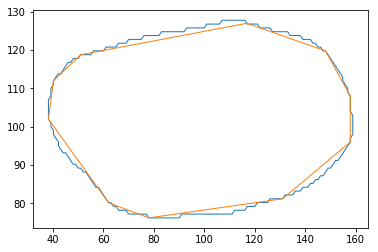

89
corners 5


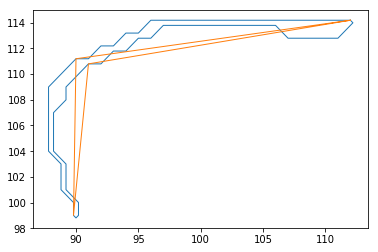

21
corners 3


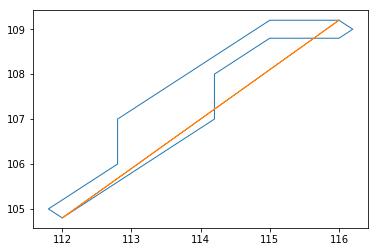

65
corners 5


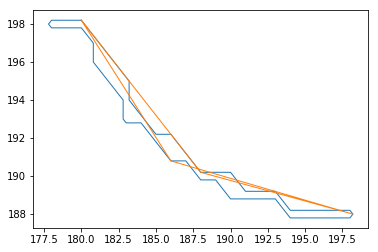

image 33
69
corners 7


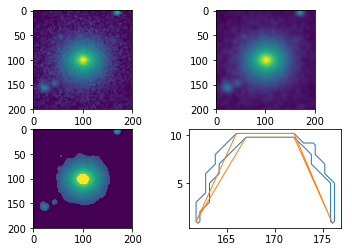

415
corners 13


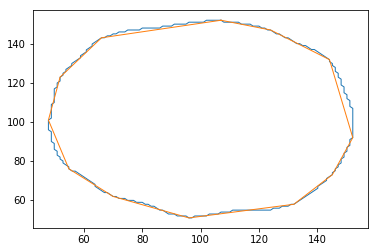

407
corners 14


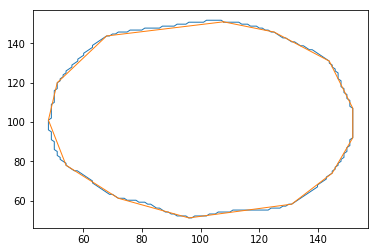

113
corners 8


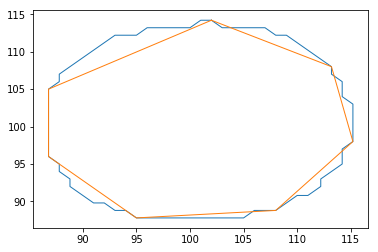

105
corners 9


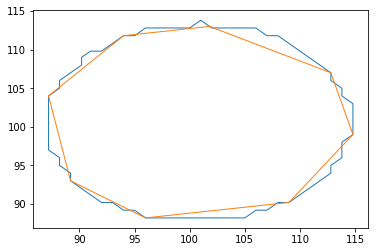

95
corners 7


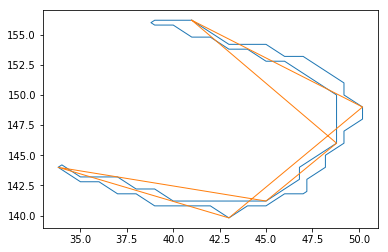

71
corners 6


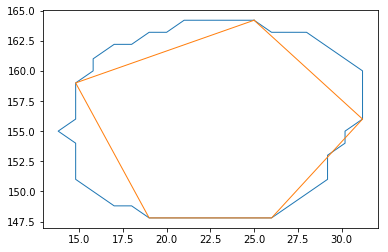

63
corners 6


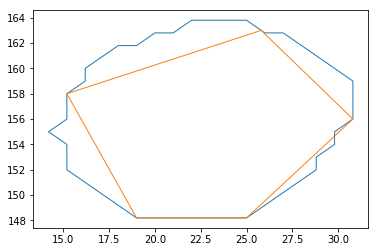

image 34
61
corners 5


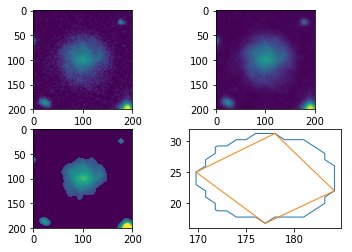

53
corners 5


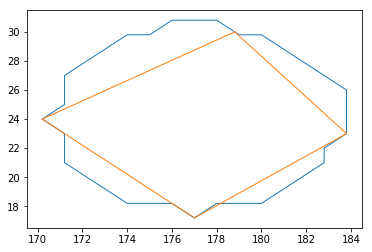

43
corners 3


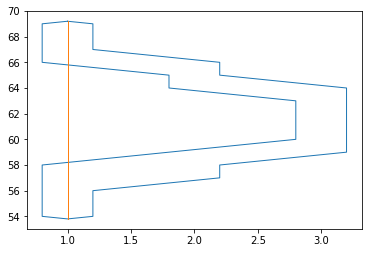

335
corners 13


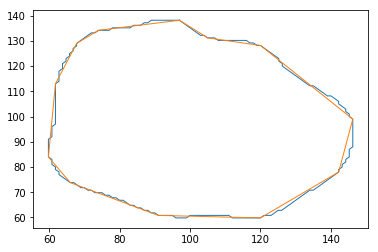

327
corners 11


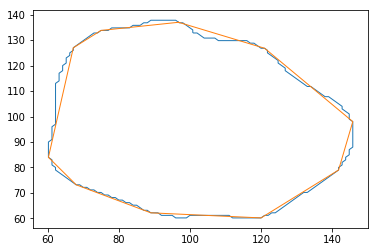

73
corners 3


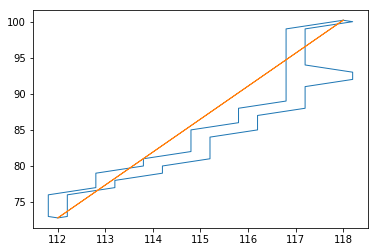

43
corners 3


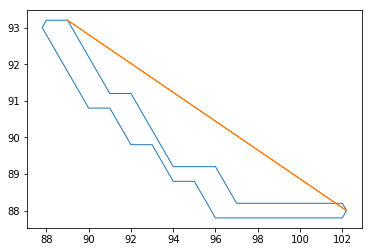

77
corners 3


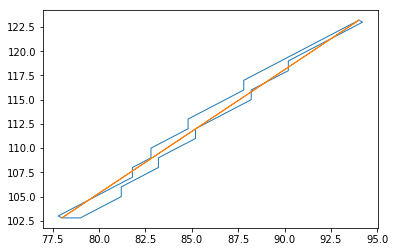

75
corners 6


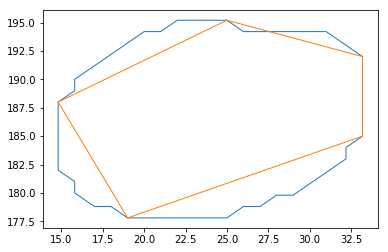

67
corners 6


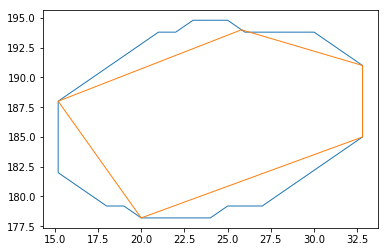

77
corners 5


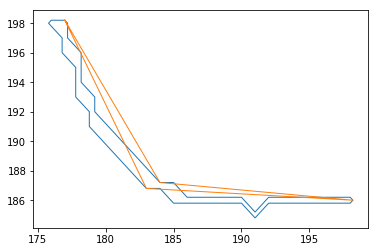

image 35
69
corners 6


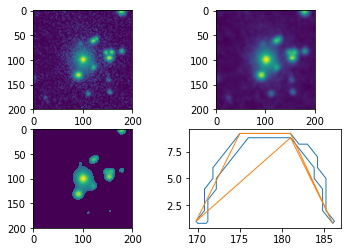

73
corners 6


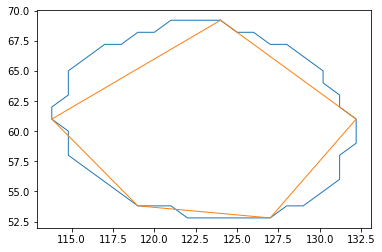

65
corners 5


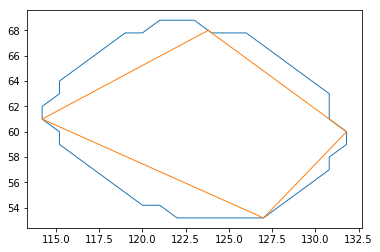

87
corners 8


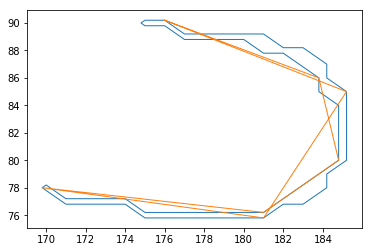

435
corners 15


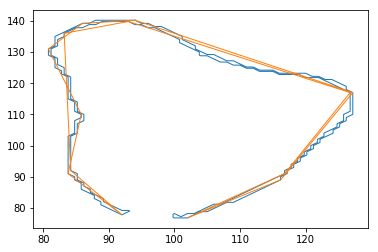

91
corners 8


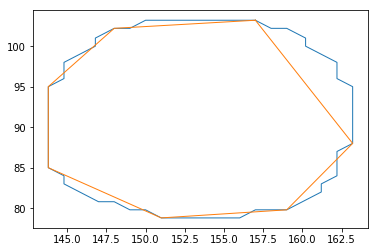

83
corners 8


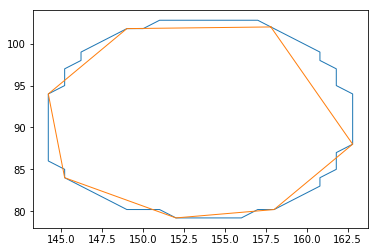

49
corners 4


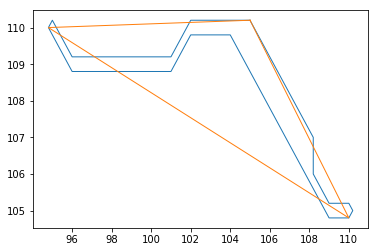

53
corners 5


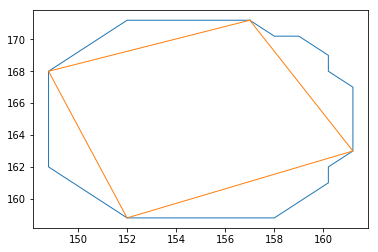

45
corners 5


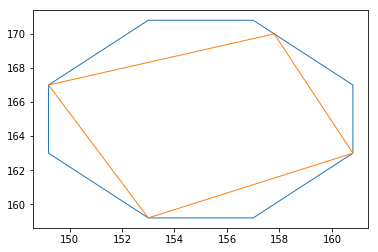

55
corners 5


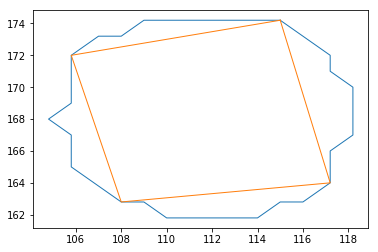

47
corners 5


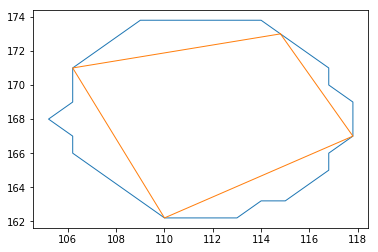

image 36
451
corners 14


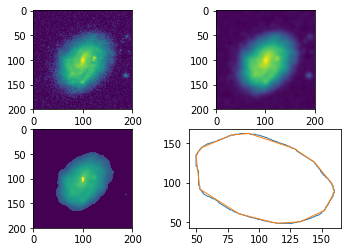

443
corners 13


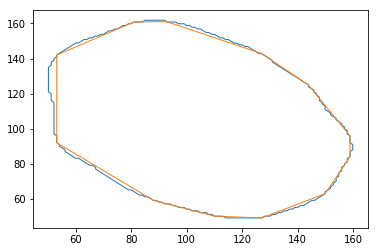

141
corners 10


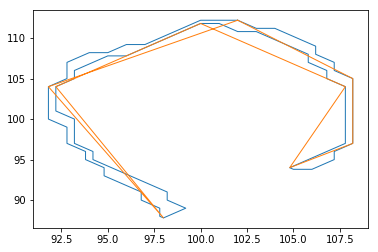

55
corners 5


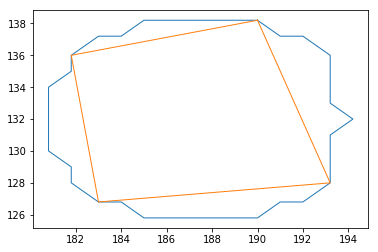

47
corners 5


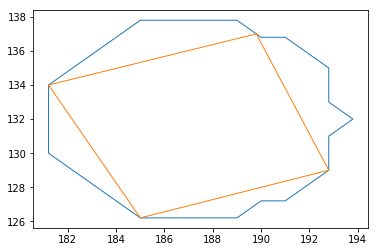

image 37
343
corners 14


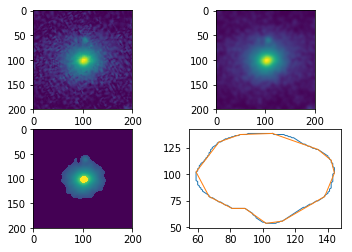

335
corners 14


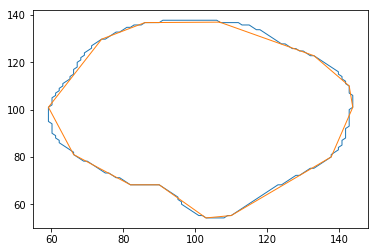

93
corners 8


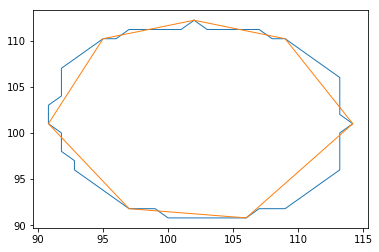

85
corners 7


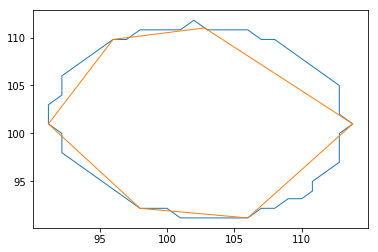

image 38
663
corners 24


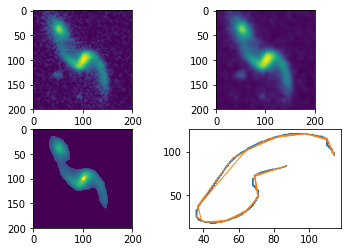

337
corners 14


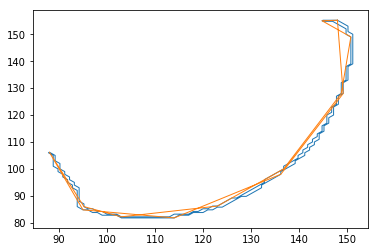

141
corners 6


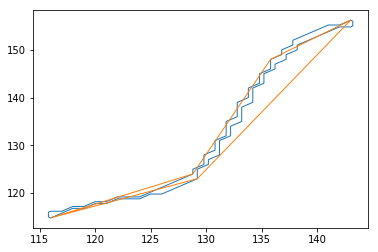

image 39
515
corners 16


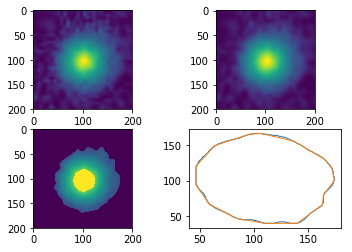

507
corners 16


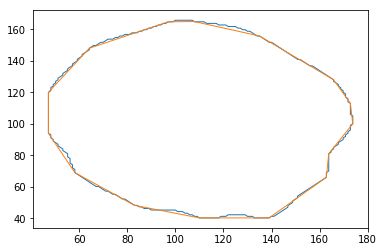

199
corners 9


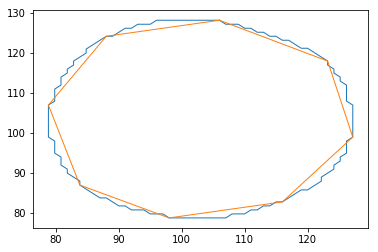

191
corners 9


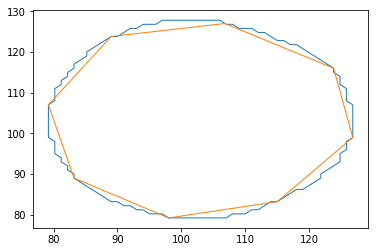

image 40
455
corners 13


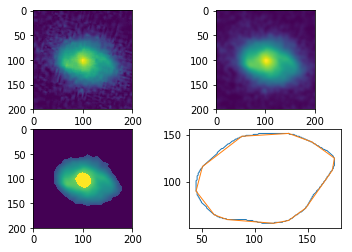

447
corners 12


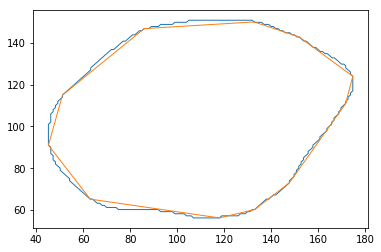

49
corners 3


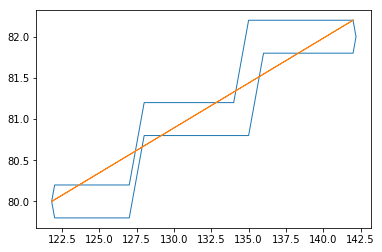

141
corners 9


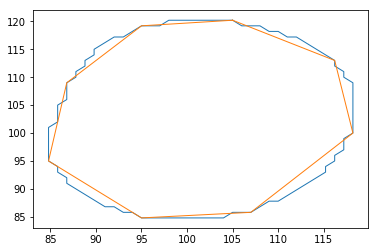

133
corners 9


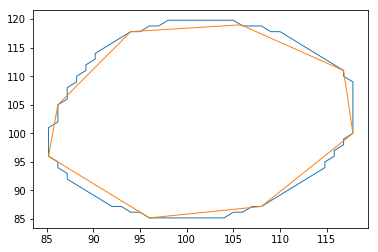

image 41
53
corners 5


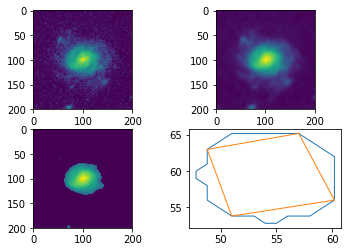

45
corners 5


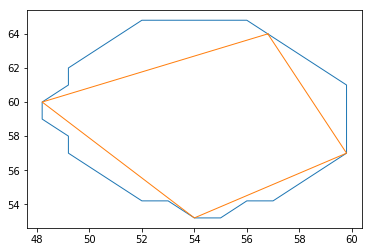

531
corners 19


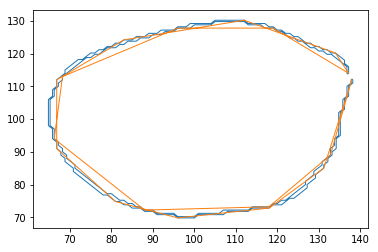

53
corners 3


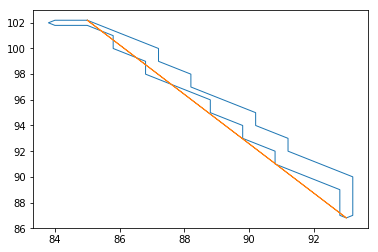

43
corners 3


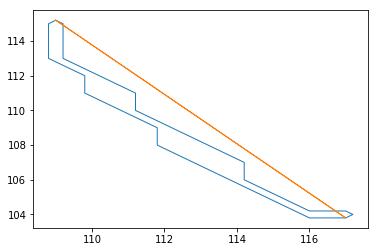

41
corners 4


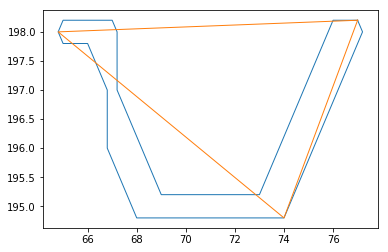

image 42
325
corners 13


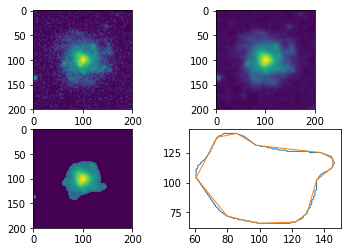

317
corners 14


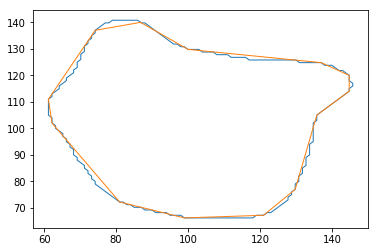

113
corners 7


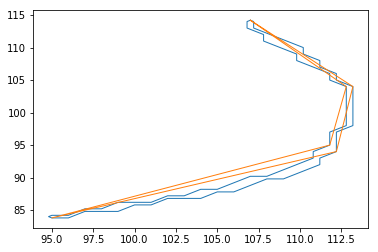

79
corners 3


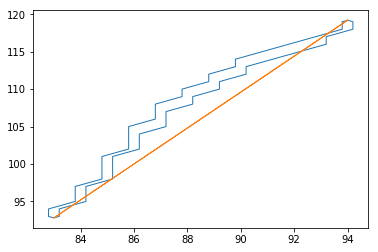

49
corners 5


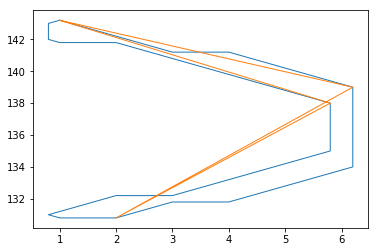

image 43
385
corners 12


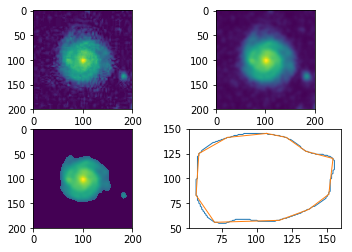

377
corners 13


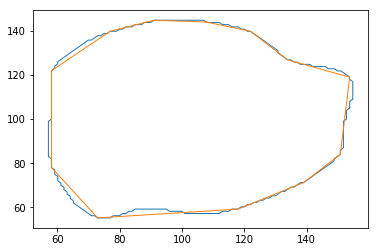

131
corners 7


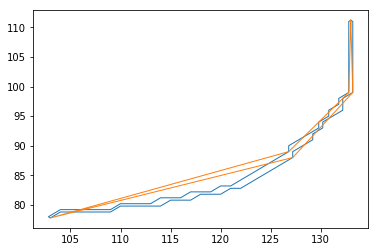

137
corners 7


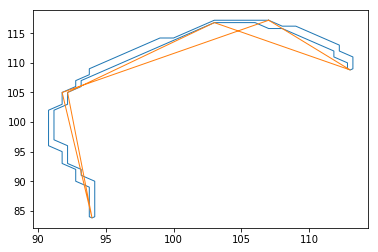

41
corners 3


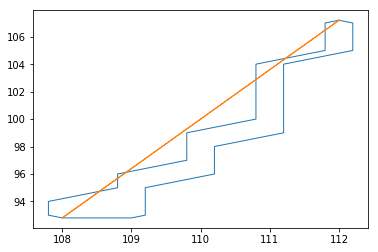

59
corners 5


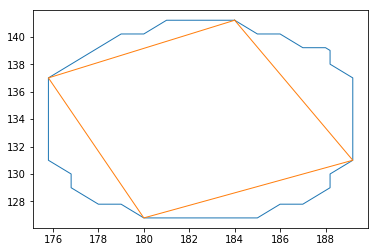

51
corners 5


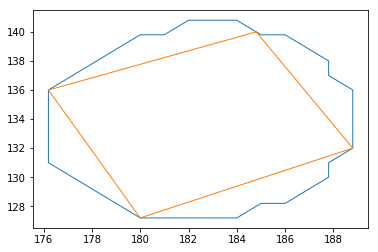

image 44
175
corners 9


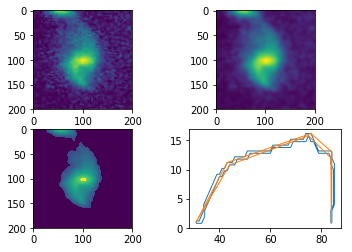

411
corners 13


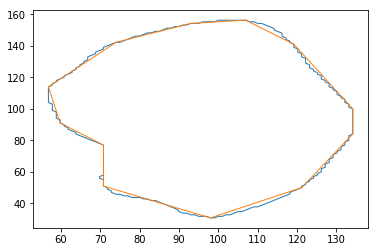

403
corners 13


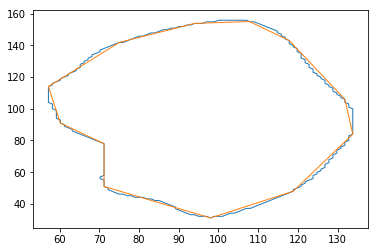

57
corners 3


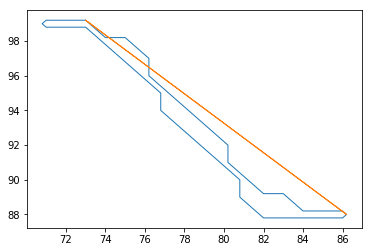

57
corners 3


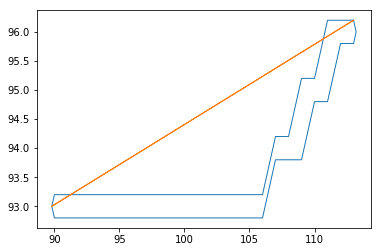

61
corners 6


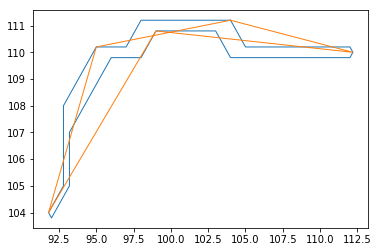

image 45
577
corners 17


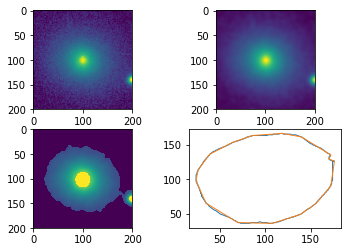

565
corners 16


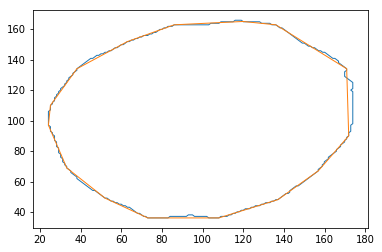

147
corners 9


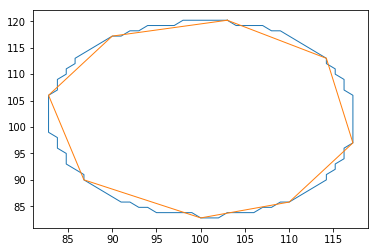

139
corners 9


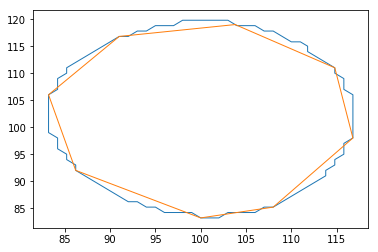

87
corners 6


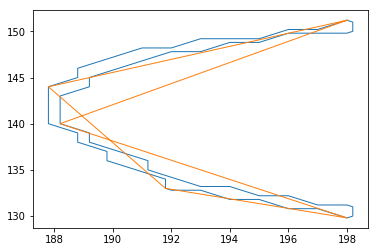

image 46
187
corners 13


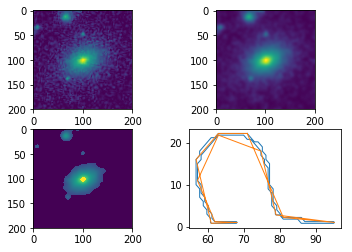

57
corners 5


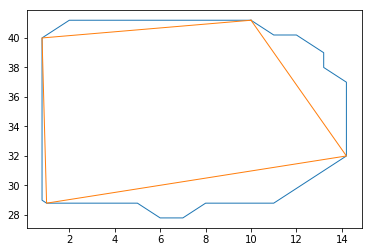

49
corners 5


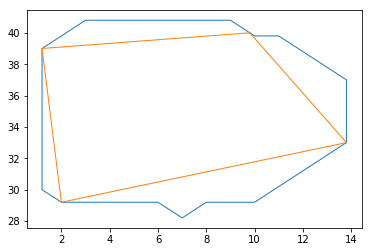

55
corners 5


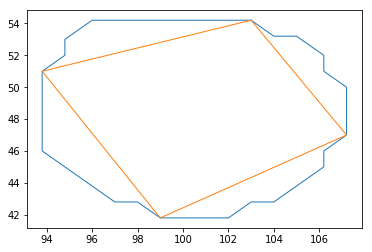

47
corners 5


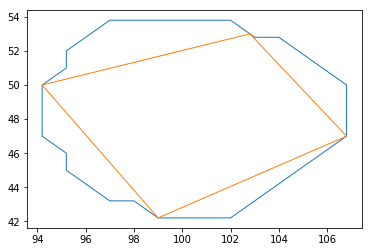

599
corners 24


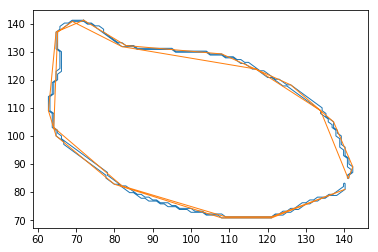

87
corners 7


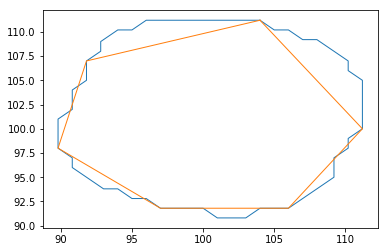

79
corners 9


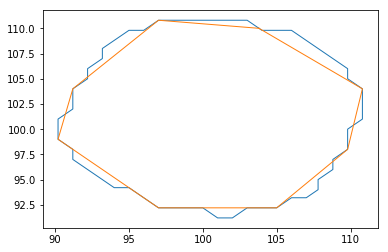

image 47
427
corners 13


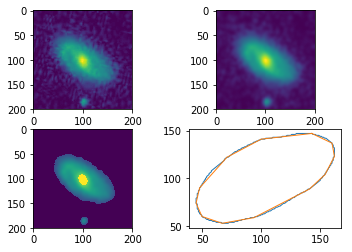

419
corners 14


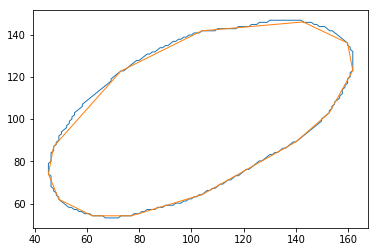

107
corners 7


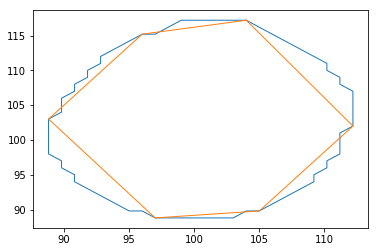

99
corners 7


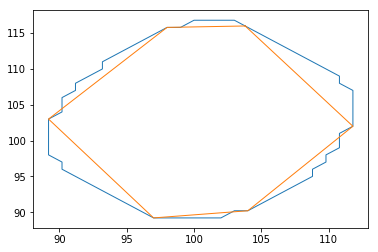

65
corners 6


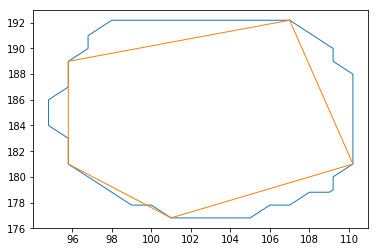

57
corners 6


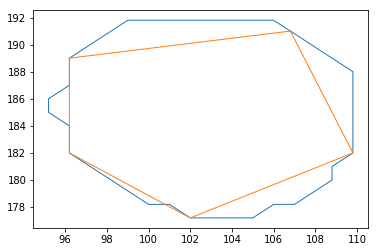

image 48
59
corners 5


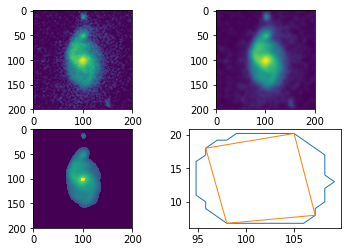

49
corners 5


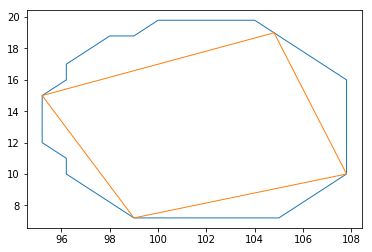

371
corners 16


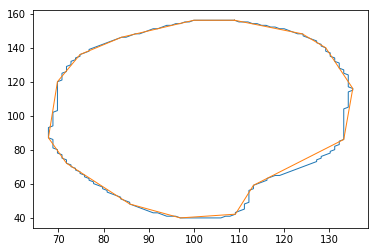

363
corners 15


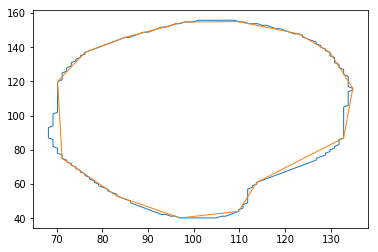

89
corners 5


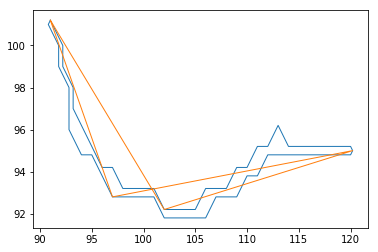

75
corners 5


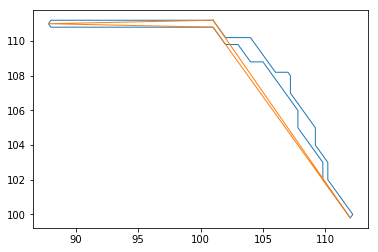

image 49
447
corners 12


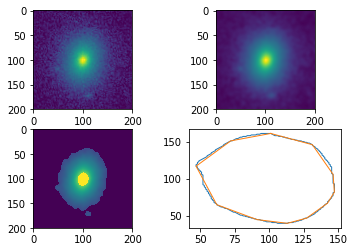

439
corners 13


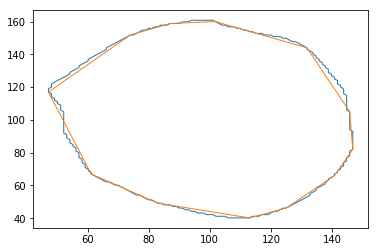

119
corners 9


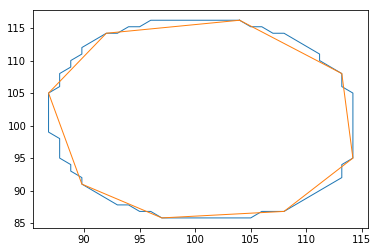

111
corners 9


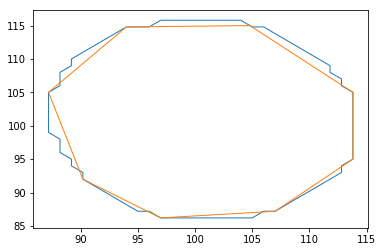

83
corners 8


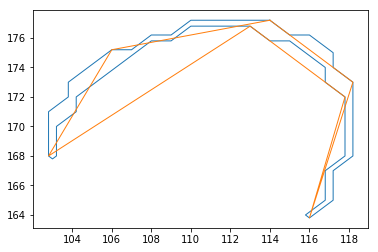

image 50
31
corners 3


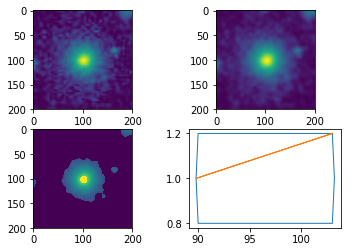

71
corners 6


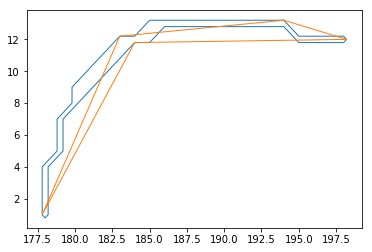

657
corners 21


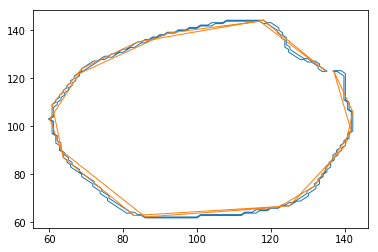

59
corners 6


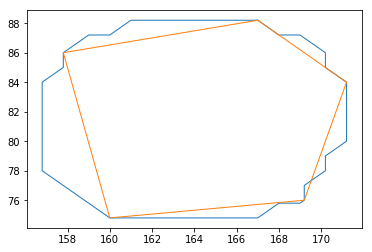

51
corners 5


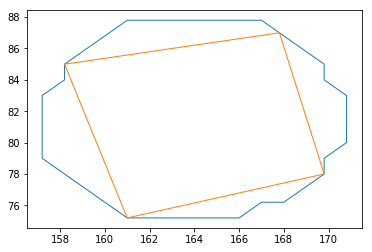

91
corners 8


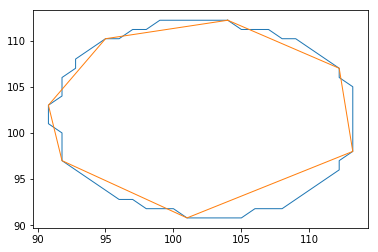

83
corners 7


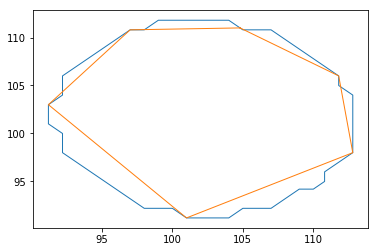

55
corners 5


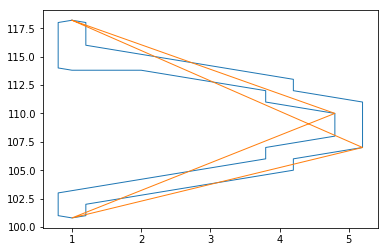

23
corners 3


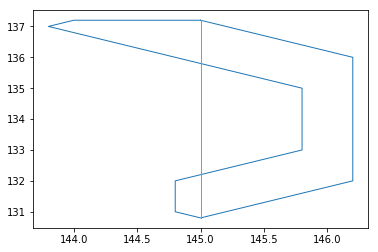

image 51
349
corners 12


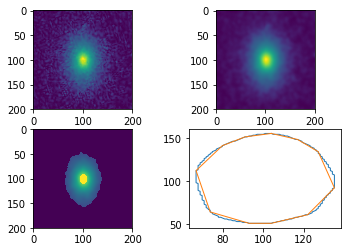

341
corners 14


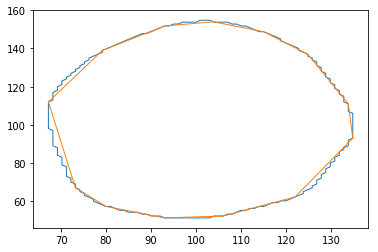

99
corners 9


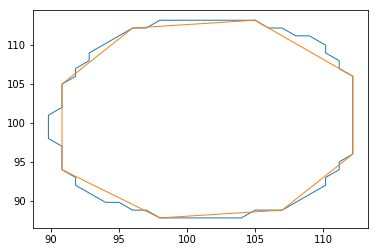

91
corners 8


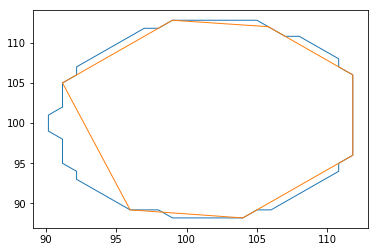

image 52
241
corners 10


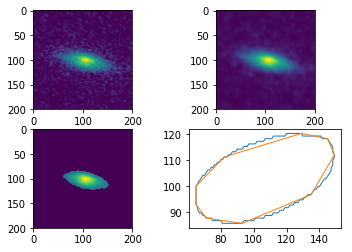

233
corners 10


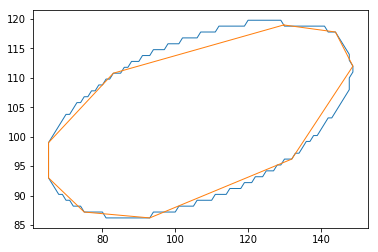

image 53
339
corners 14


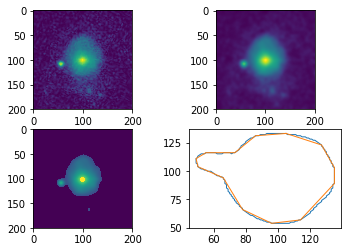

331
corners 14


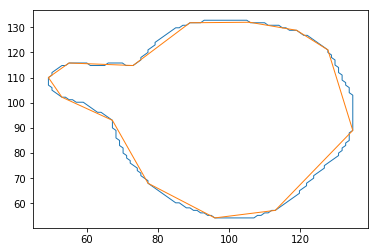

83
corners 6


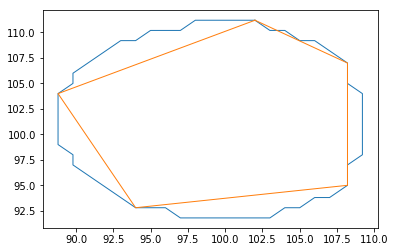

75
corners 7


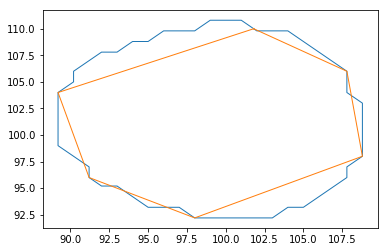

57
corners 5


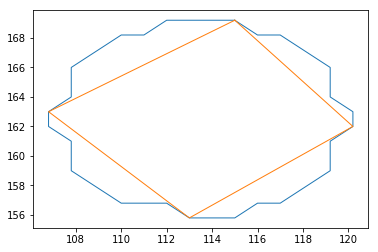

49
corners 5


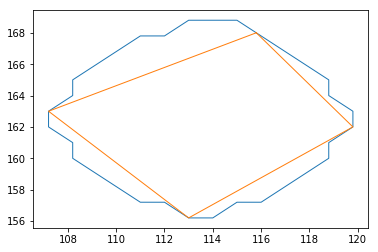

image 54
375
corners 12


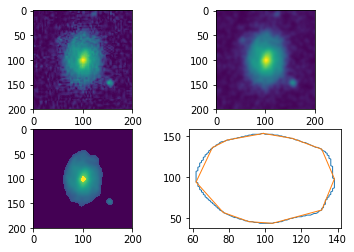

367
corners 13


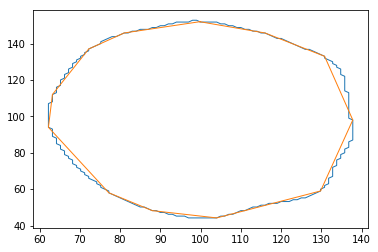

153
corners 13


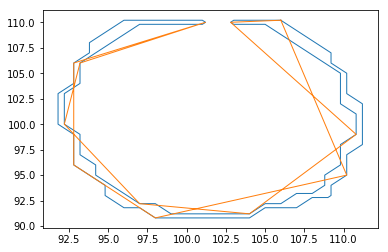

63
corners 6


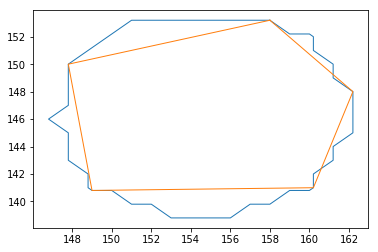

55
corners 5


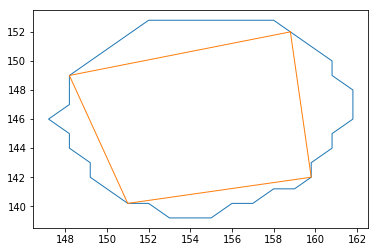

image 55
491
corners 13


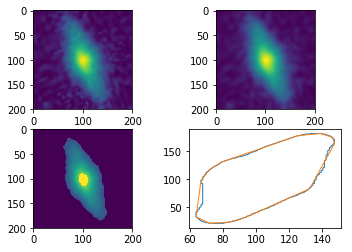

483
corners 12


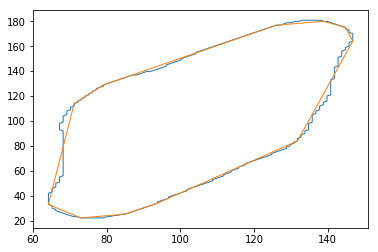

119
corners 9


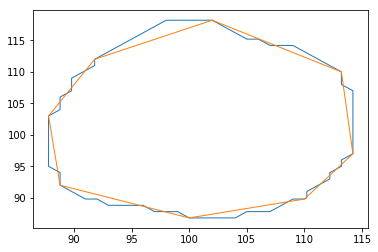

111
corners 9


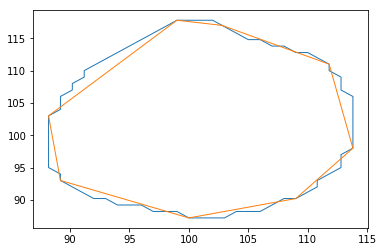

image 56
55
corners 5


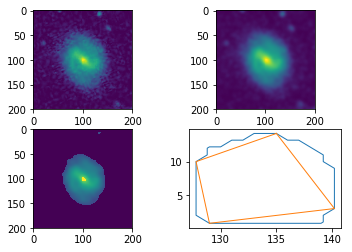

47
corners 5


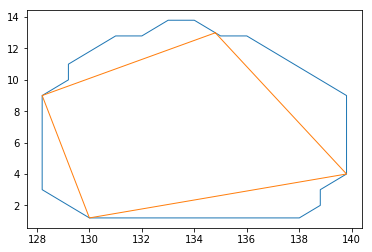

367
corners 12


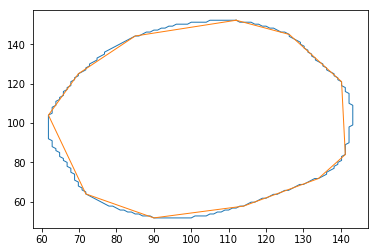

359
corners 12


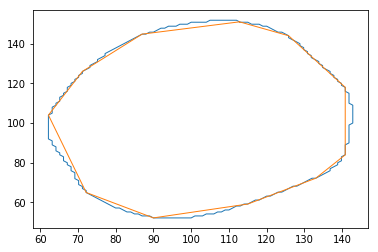

131
corners 7


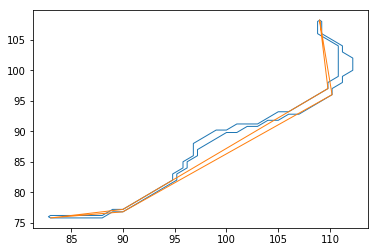

93
corners 6


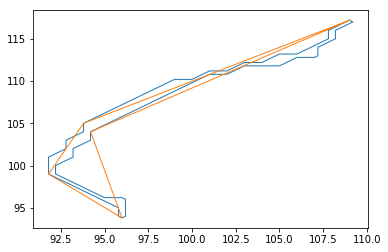

23
corners 3


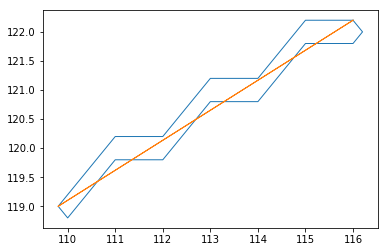

image 57
321
corners 11


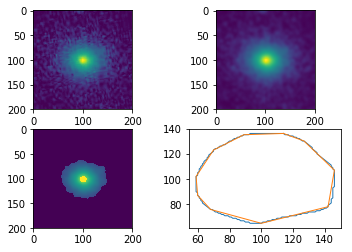

313
corners 11


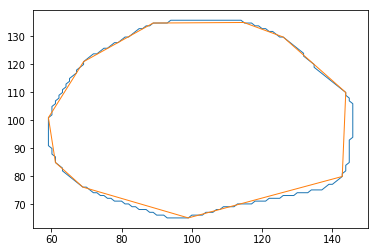

85
corners 8


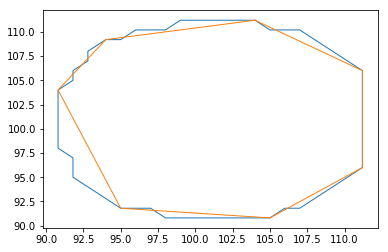

77
corners 7


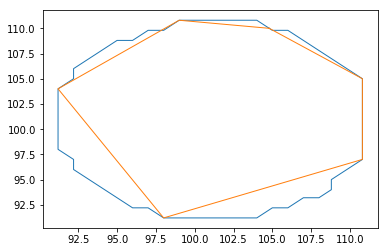

image 58
37
corners 3


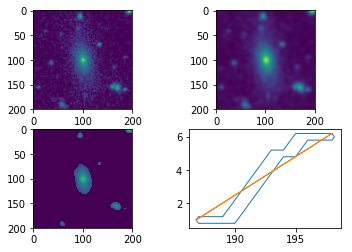

59
corners 6


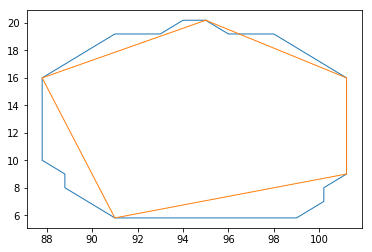

51
corners 5


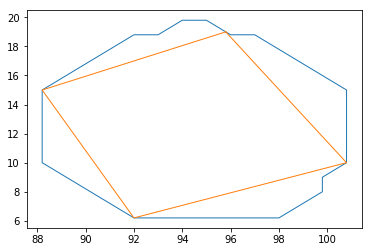

55
corners 5


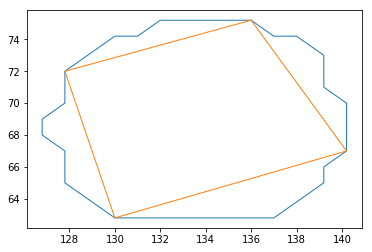

47
corners 5


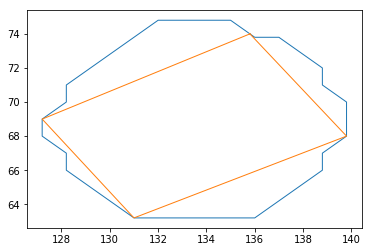

331
corners 17


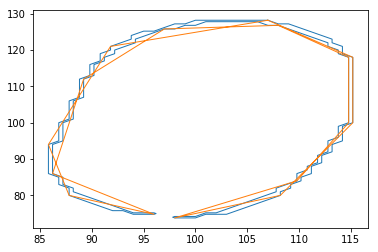

71
corners 6


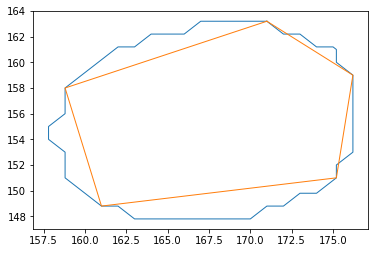

63
corners 5


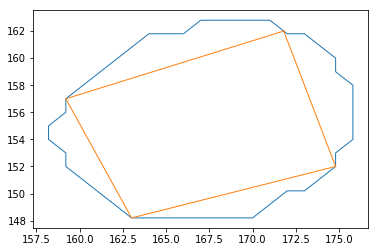

59
corners 5


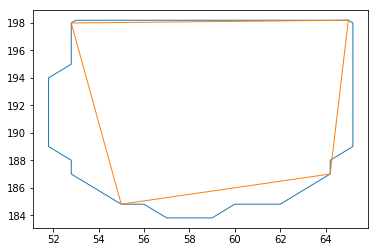

51
corners 5


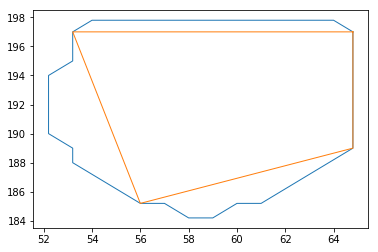

image 59
531
corners 14


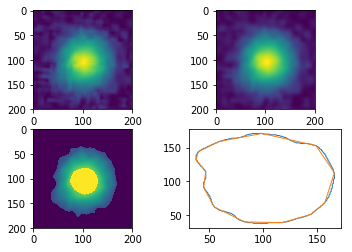

523
corners 19


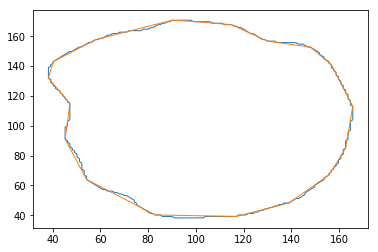

37
corners 3


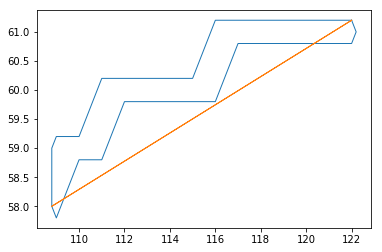

241
corners 10


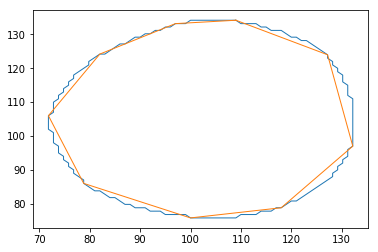

233
corners 9


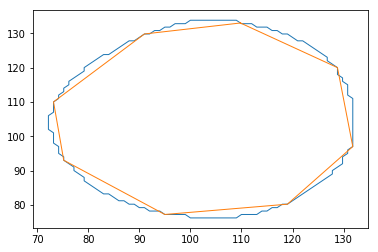

21
corners 3


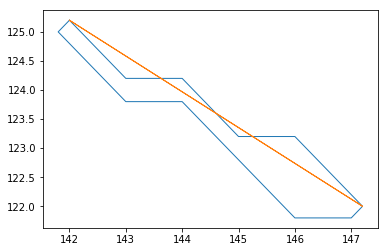

23
corners 3


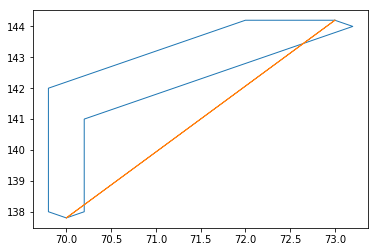

image 60
59
corners 5


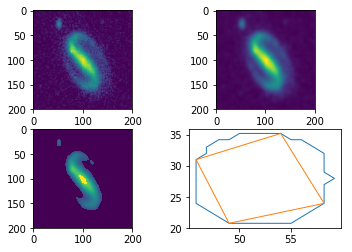

49
corners 5


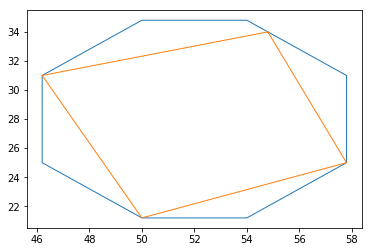

399
corners 15


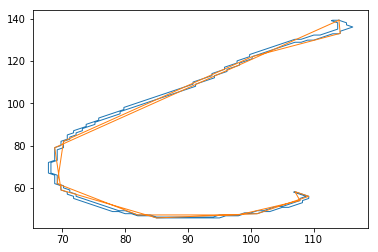

27
corners 3


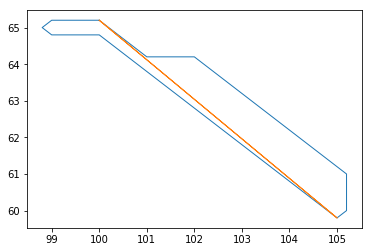

69
corners 7


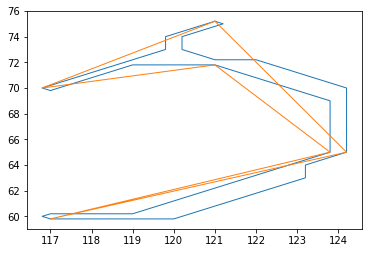

451
corners 17


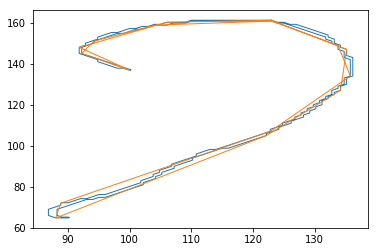

image 61
31
corners 3


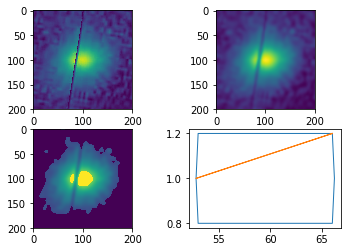

29
corners 3


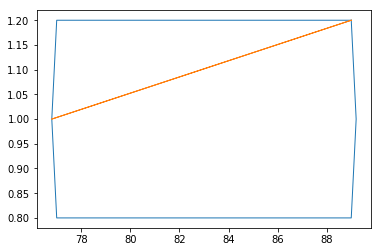

1309
corners 38


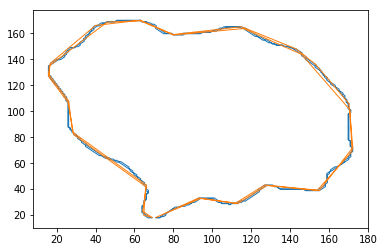

57
corners 5


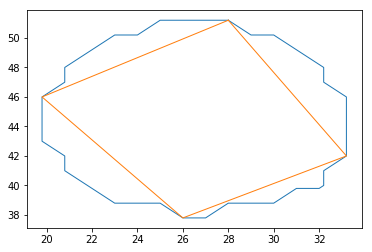

49
corners 5


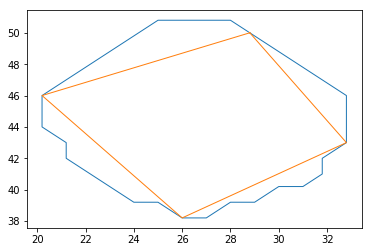

33
corners 3


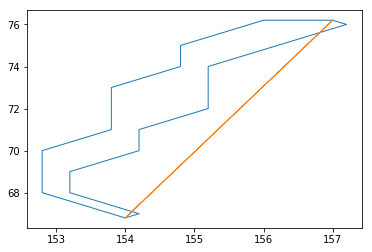

271
corners 15


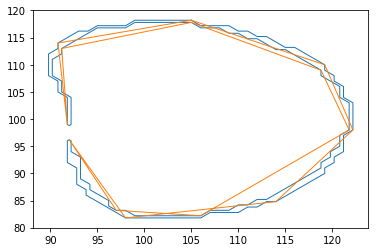

119
corners 8


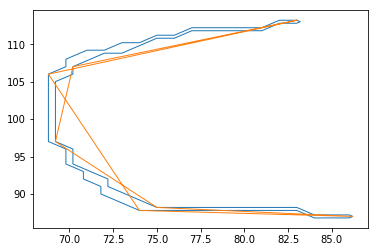

23
corners 3


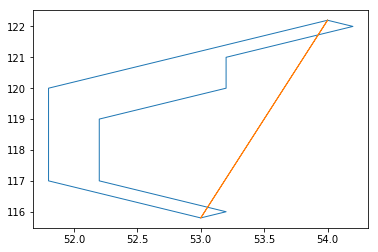

37
corners 5


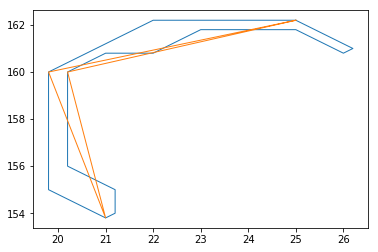

image 62
115
corners 6


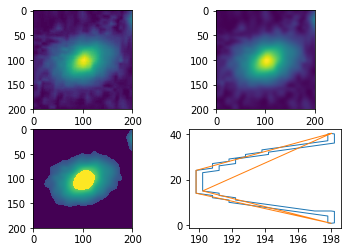

519
corners 13


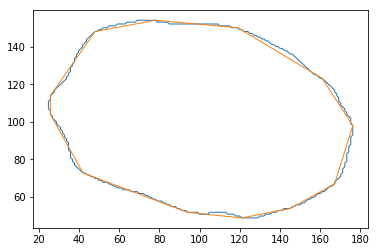

511
corners 13


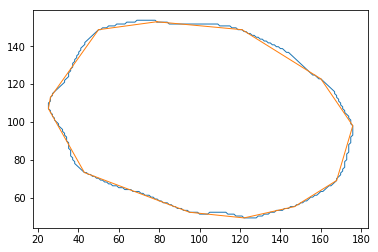

193
corners 9


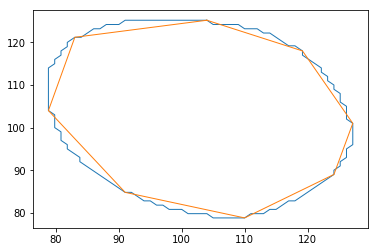

185
corners 10


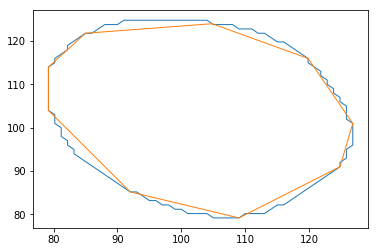

21
corners 3


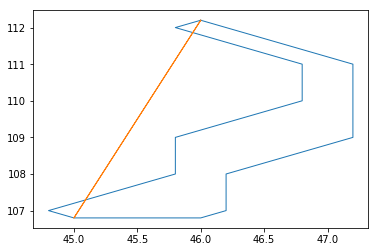

image 63
341
corners 13


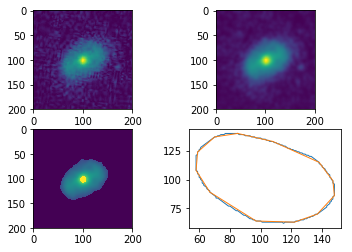

333
corners 13


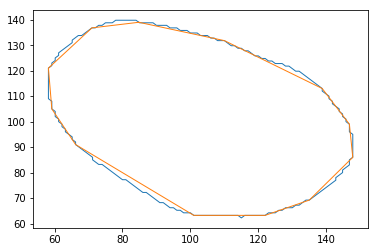

85
corners 7


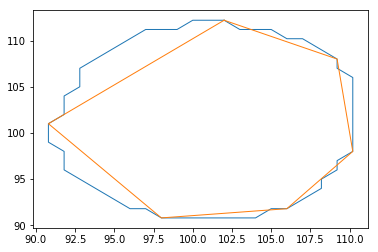

77
corners 7


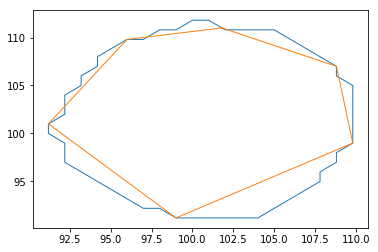

image 64
757
corners 21


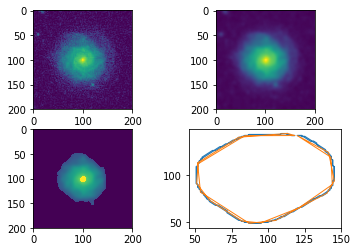

57
corners 4


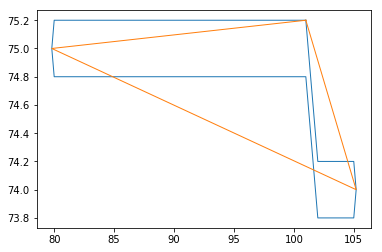

79
corners 8


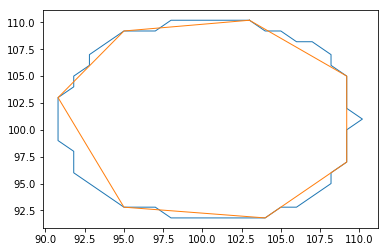

27
corners 3


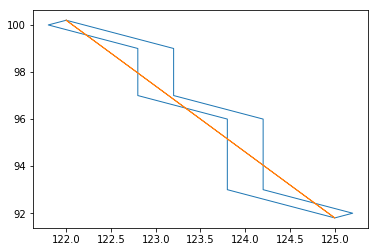

71
corners 6


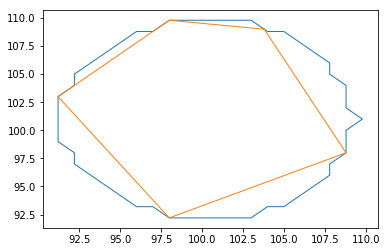

image 65
373
corners 13


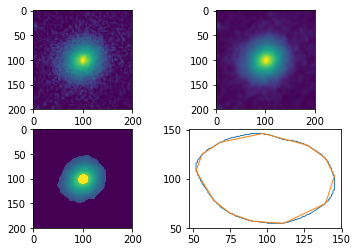

365
corners 15


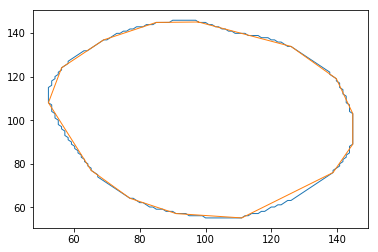

105
corners 8


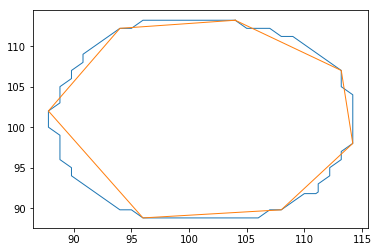

97
corners 9


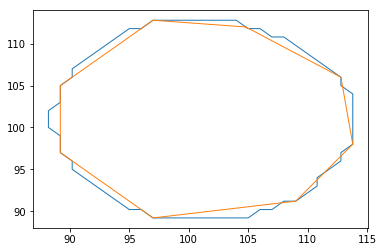

image 66
45
corners 4


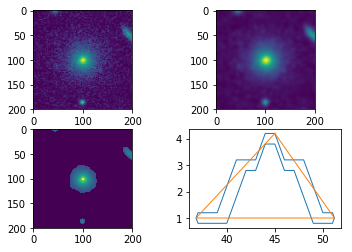

113
corners 7


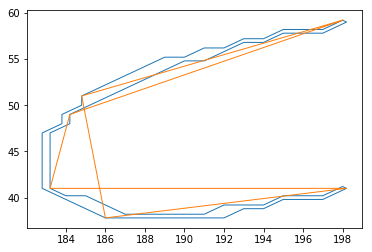

201
corners 9


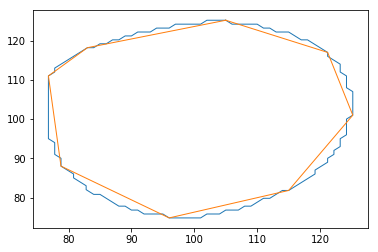

193
corners 9


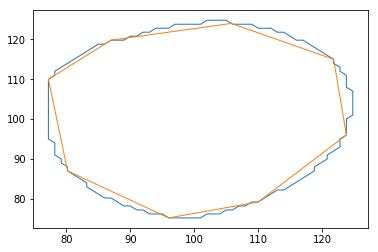

177
corners 14


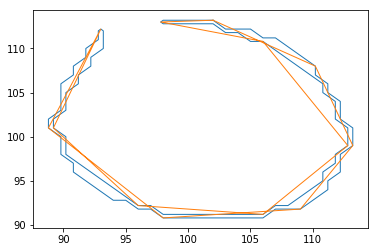

57
corners 5


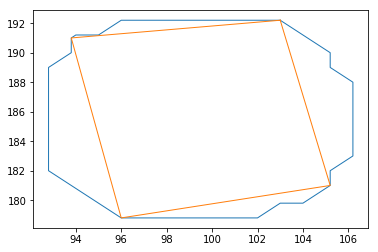

49
corners 5


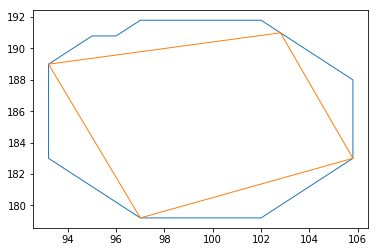

image 67
69
corners 7


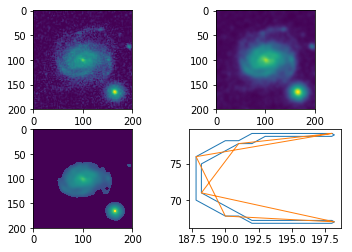

375
corners 15


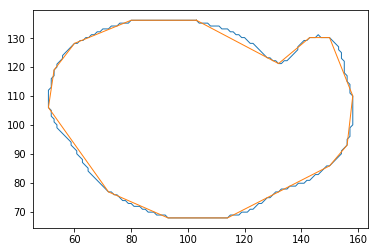

367
corners 15


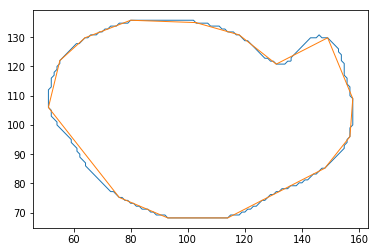

77
corners 5


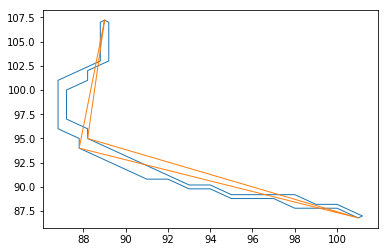

29
corners 3


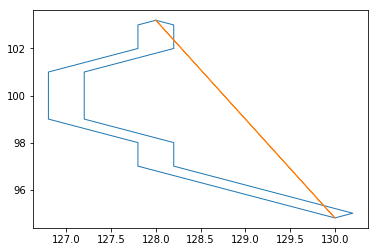

113
corners 5


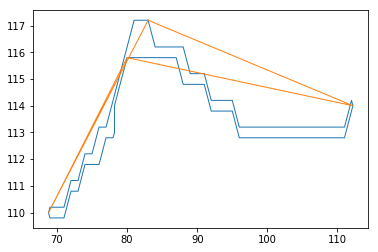

117
corners 9


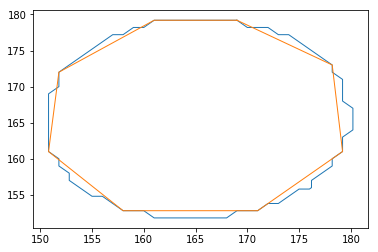

109
corners 9


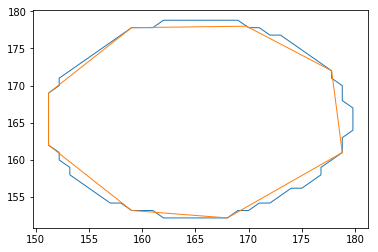

image 68
1013
corners 33


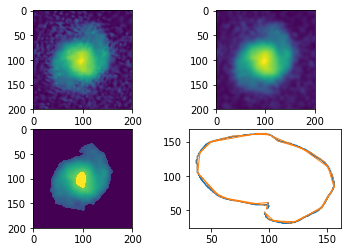

71
corners 3


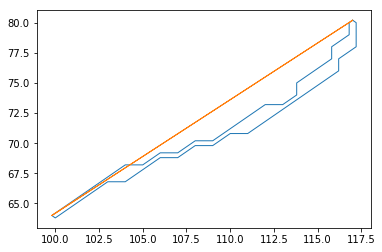

127
corners 9


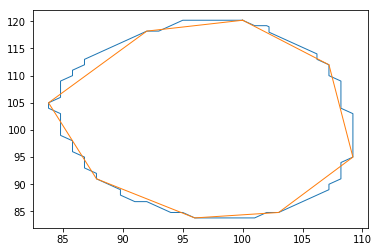

119
corners 8


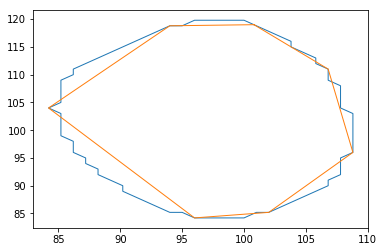

77
corners 4


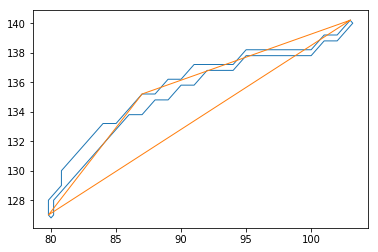

image 69
431
corners 12


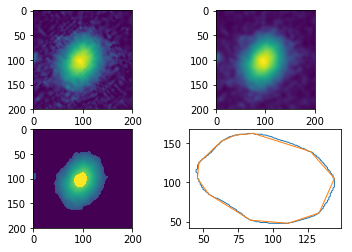

423
corners 12


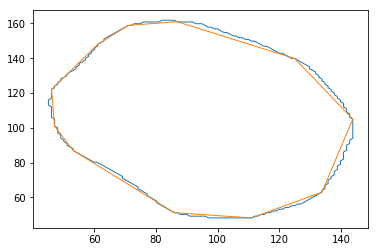

29
corners 3


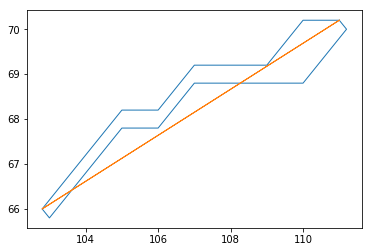

133
corners 9


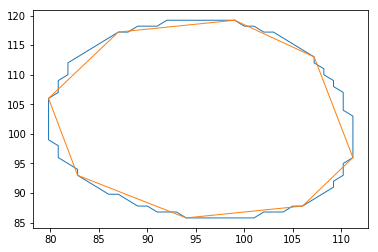

125
corners 9


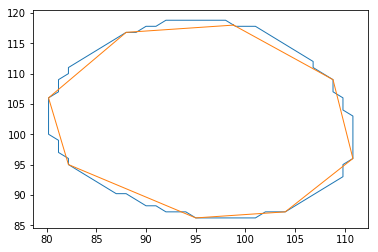

55
corners 5


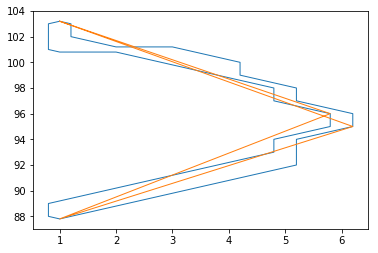

image 70
315
corners 11


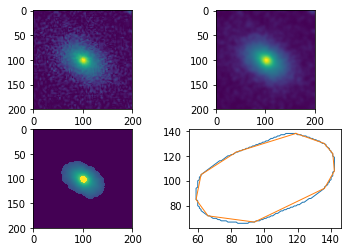

307
corners 13


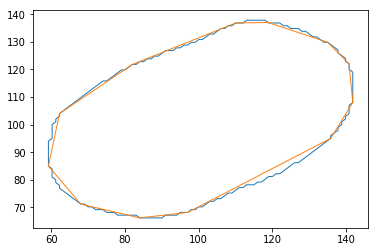

91
corners 7


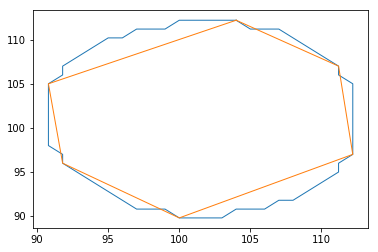

83
corners 6


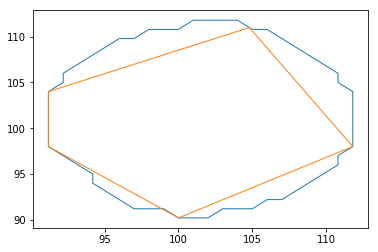

image 71
83
corners 7


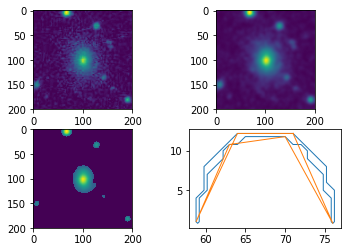

61
corners 5


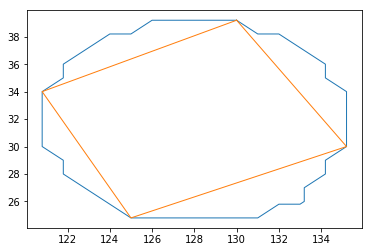

53
corners 5


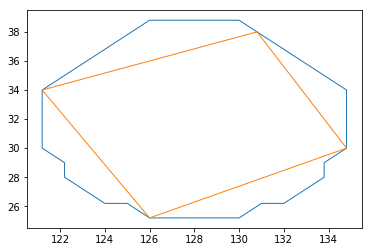

333
corners 18


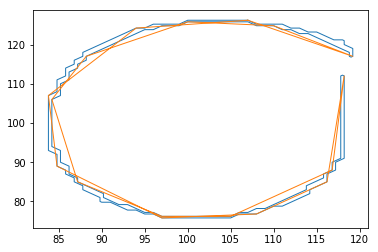

55
corners 5


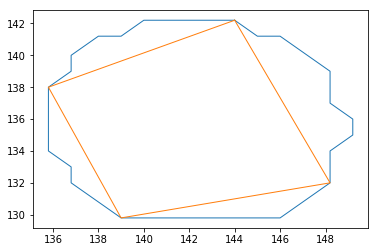

47
corners 5


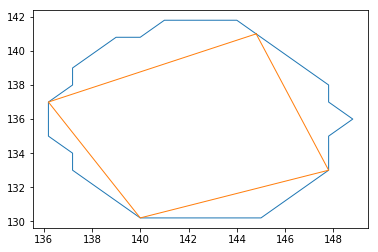

91
corners 8


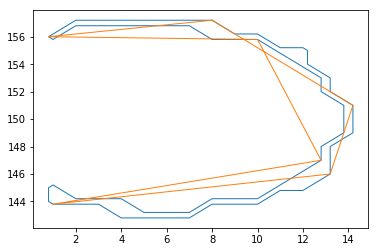

59
corners 5


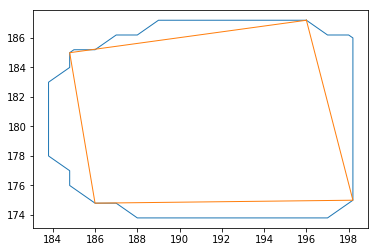

51
corners 5


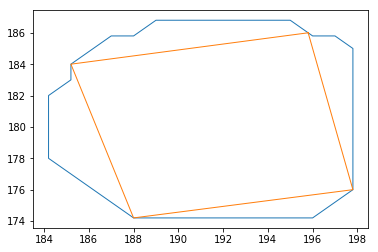

image 72
339
corners 11


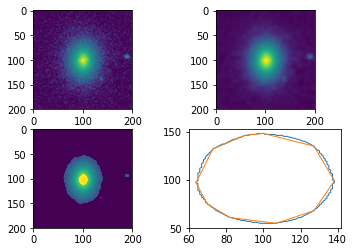

331
corners 12


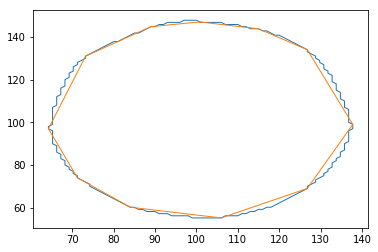

57
corners 5


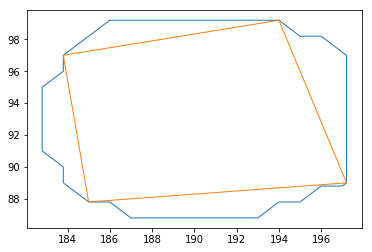

107
corners 9


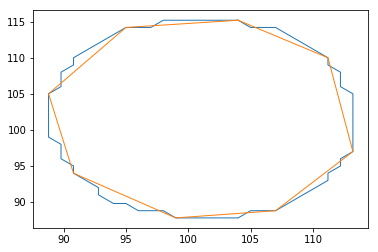

49
corners 5


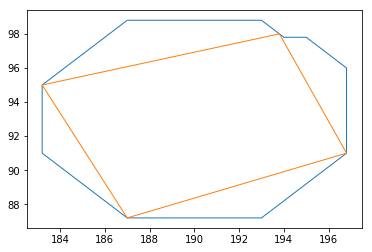

99
corners 9


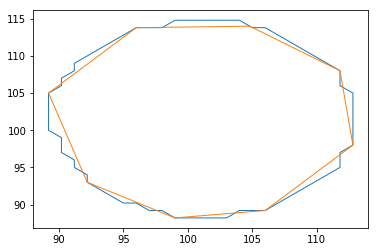

image 73
397
corners 14


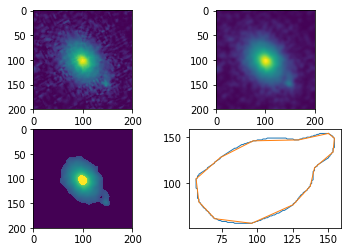

389
corners 15


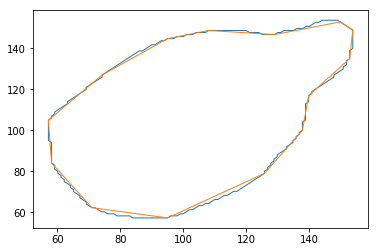

103
corners 9


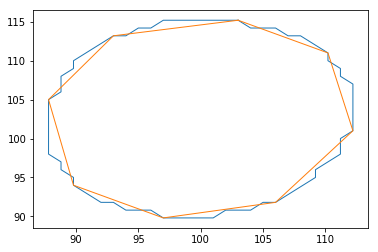

95
corners 9


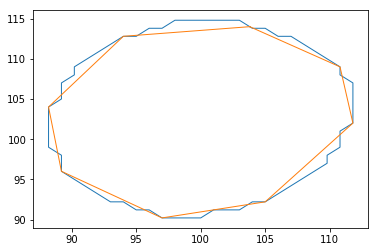

image 74
415
corners 12


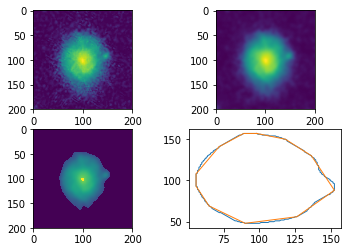

407
corners 12


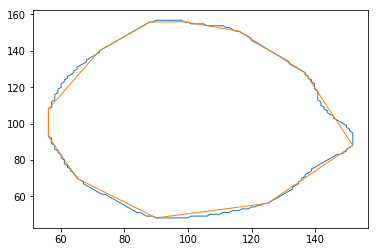

123
corners 7


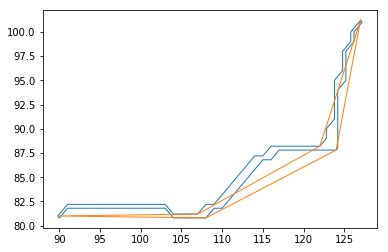

115
corners 9


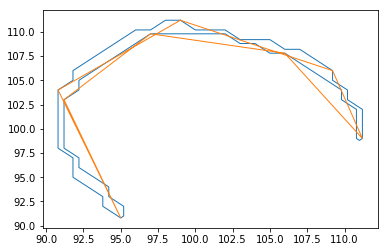

image 75
385
corners 11


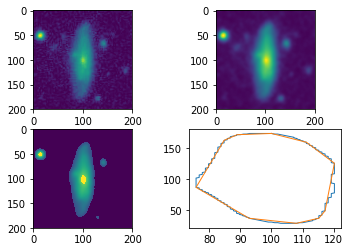

377
corners 12


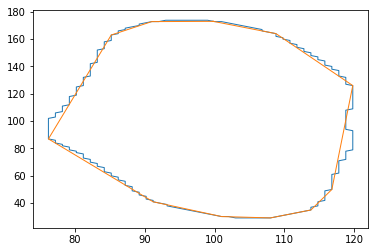

137
corners 10


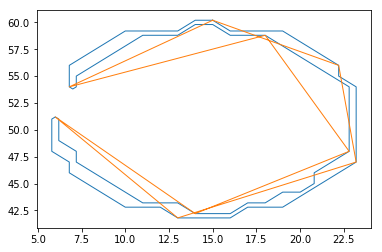

65
corners 5


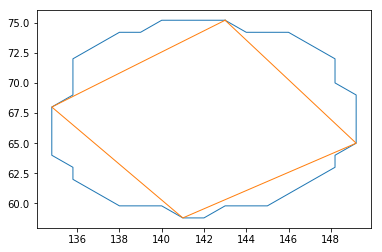

57
corners 5


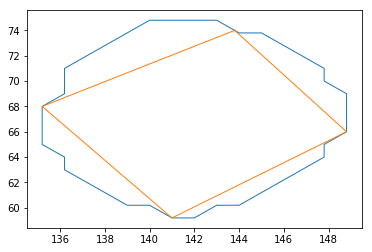

59
corners 5


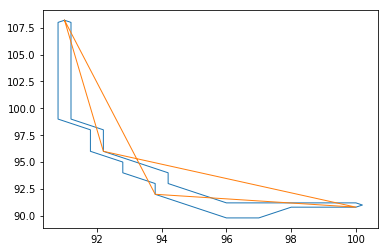

21
corners 3


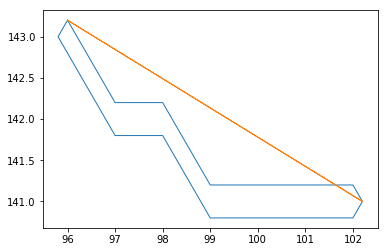

53
corners 5


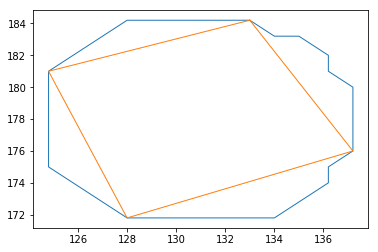

45
corners 5


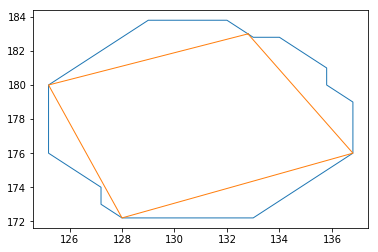

image 76
73
corners 7


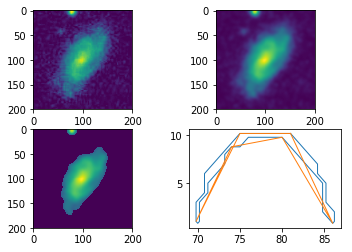

447
corners 11


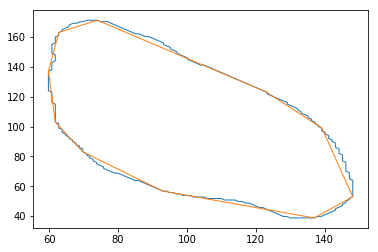

439
corners 12


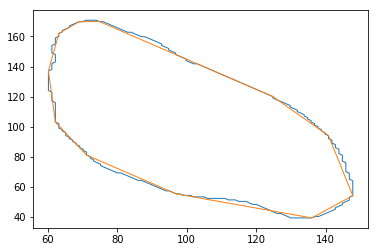

33
corners 3


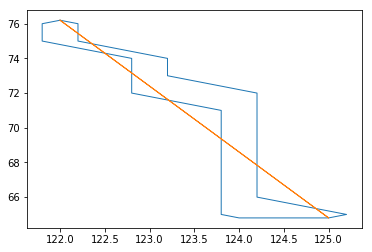

31
corners 4


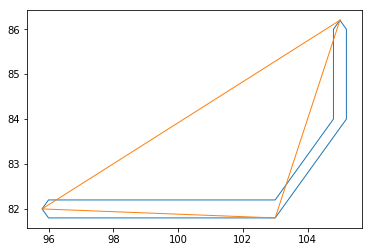

41
corners 3


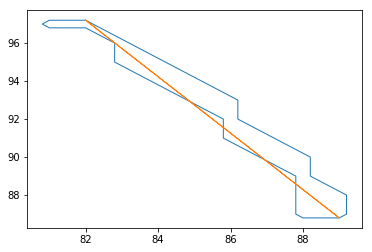

127
corners 6


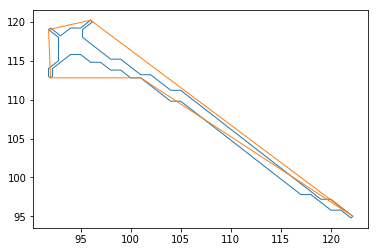

37
corners 3


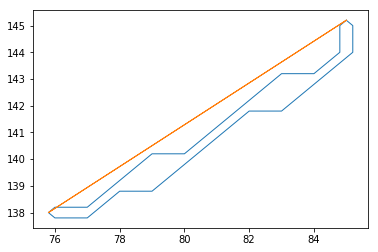

image 77
757
corners 21


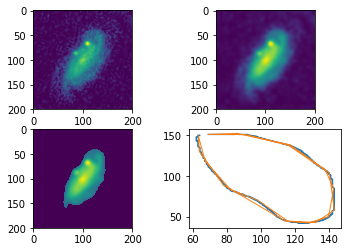

55
corners 3


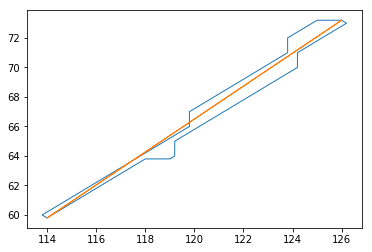

143
corners 3


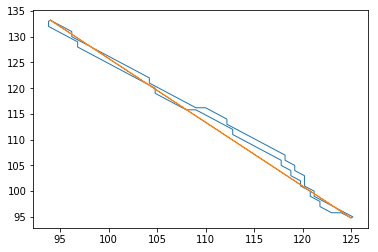

image 78
515
corners 17


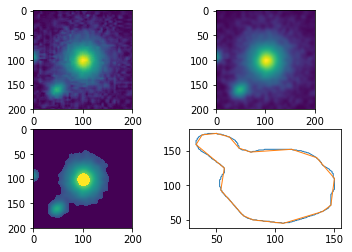

507
corners 18


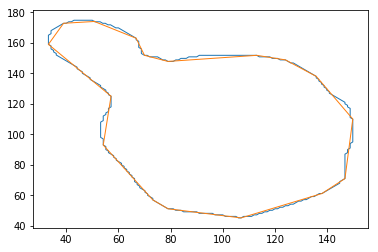

85
corners 7


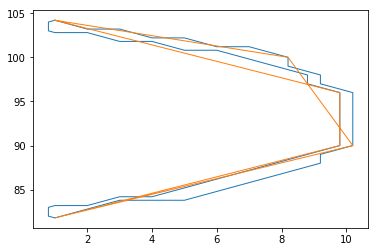

125
corners 9


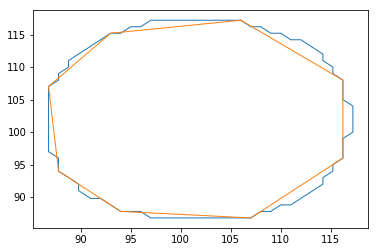

117
corners 9


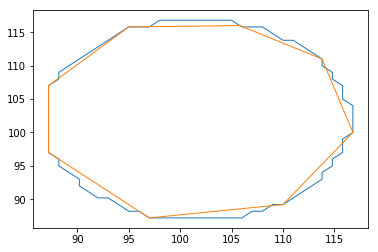

image 79
325
corners 12


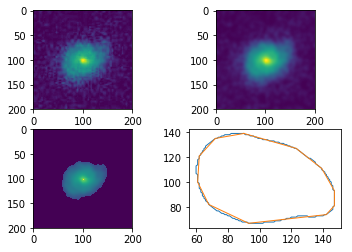

317
corners 12


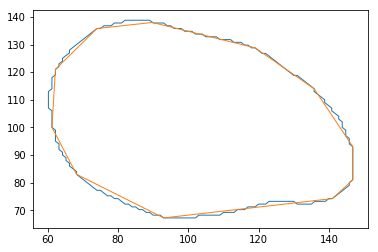

79
corners 5


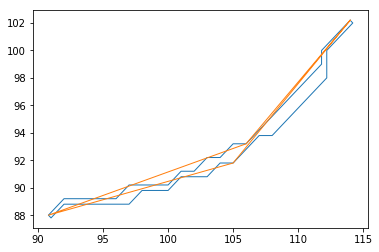

71
corners 5


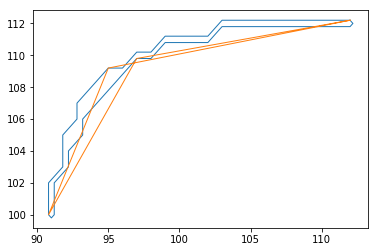

image 80
397
corners 9


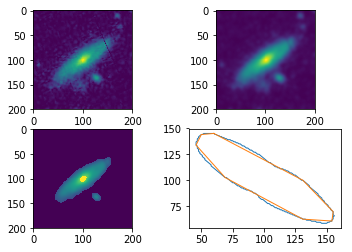

387
corners 11


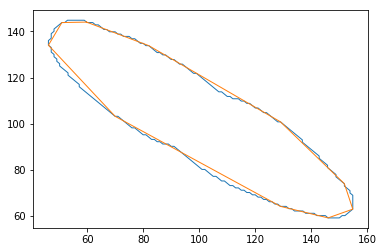

67
corners 6


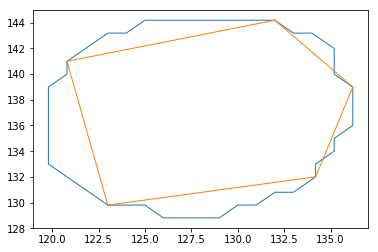

59
corners 5


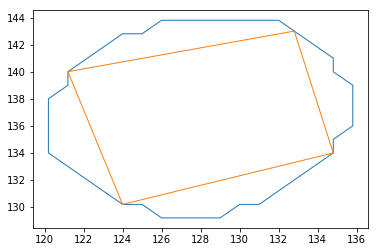

image 81
521
corners 15


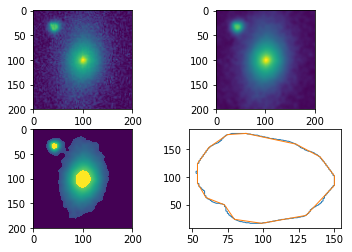

513
corners 17


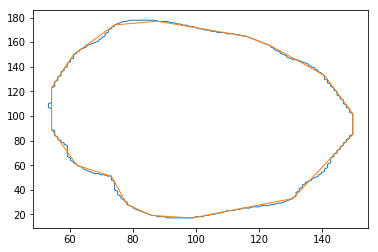

93
corners 8


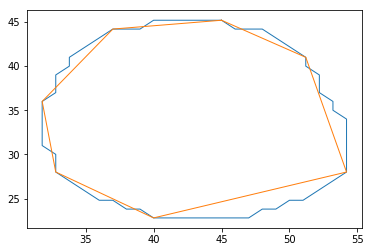

85
corners 7


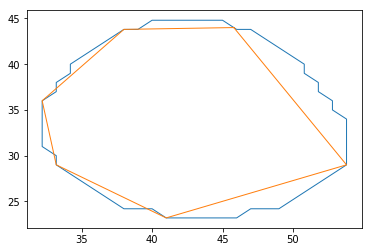

151
corners 9


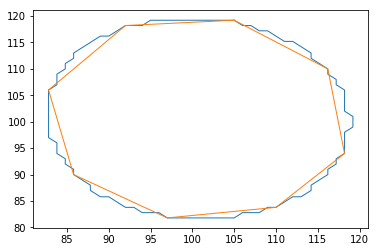

143
corners 9


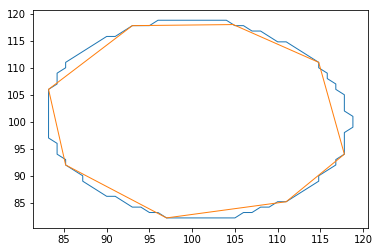

image 82
441
corners 13


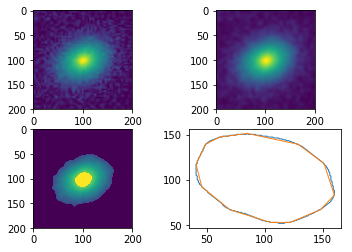

433
corners 13


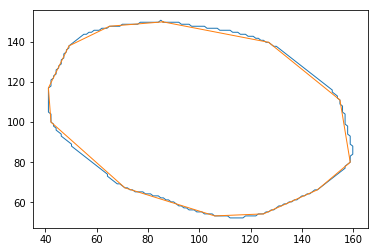

145
corners 9


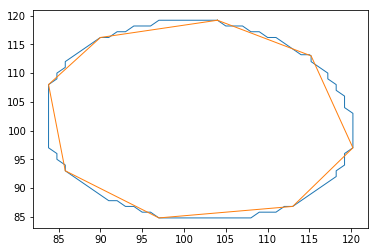

137
corners 9


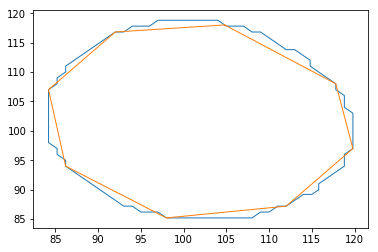

image 83
393
corners 14


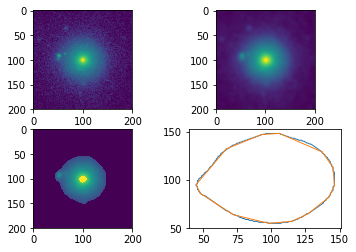

385
corners 15


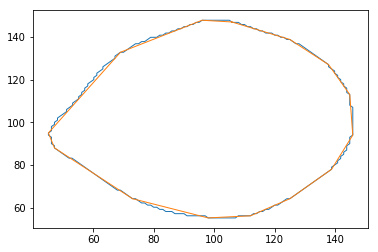

87
corners 7


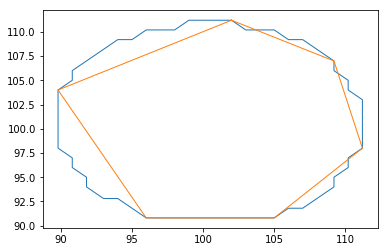

79
corners 8


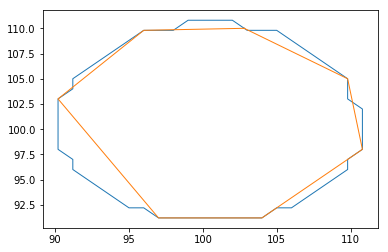

image 84
57
corners 5


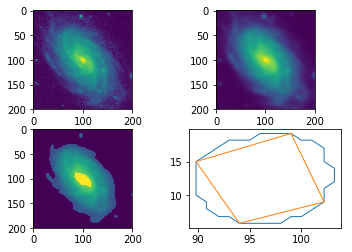

49
corners 5


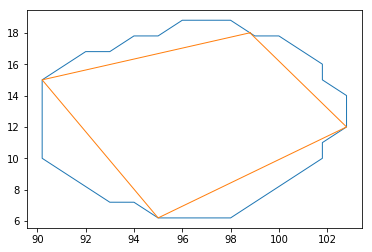

1079
corners 29


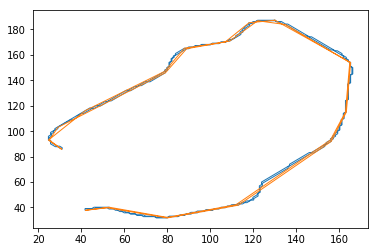

209
corners 5


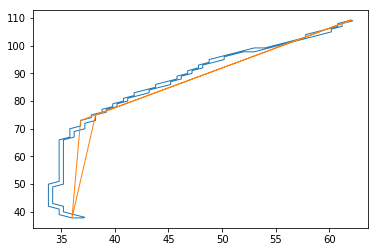

21
corners 3


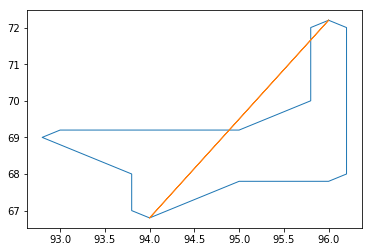

275
corners 18


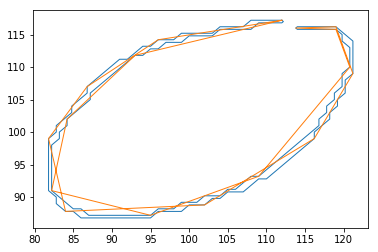

29
corners 3


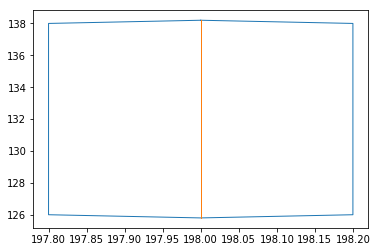

51
corners 3


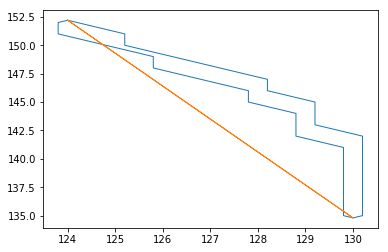

23
corners 3


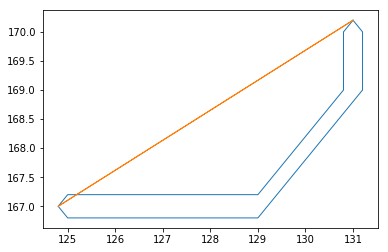

53
corners 5


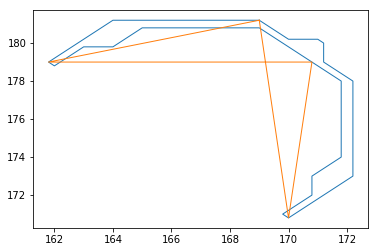

image 85
167
corners 6


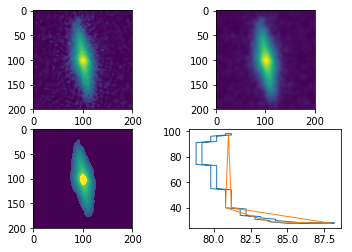

561
corners 17


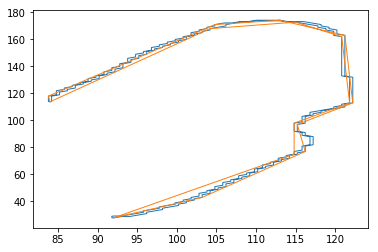

45
corners 3


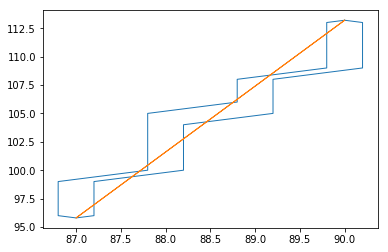

image 86
1041
corners 40


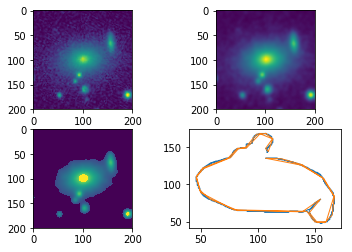

95
corners 8


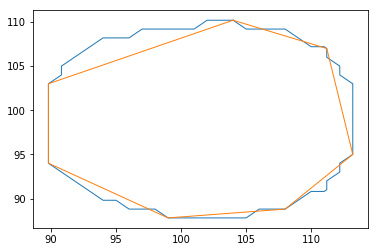

87
corners 8


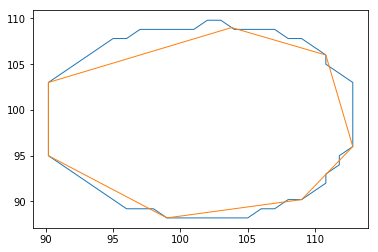

33
corners 3


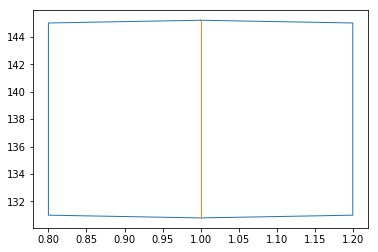

47
corners 3


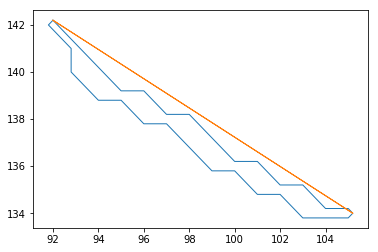

21
corners 4


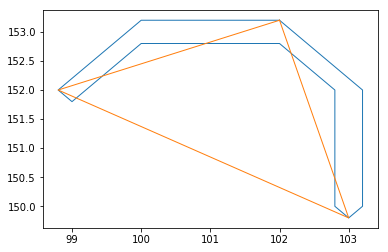

101
corners 7


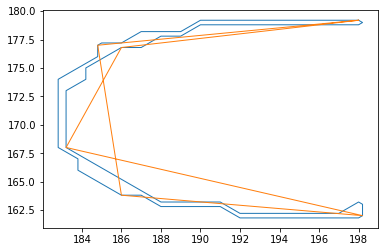

61
corners 5


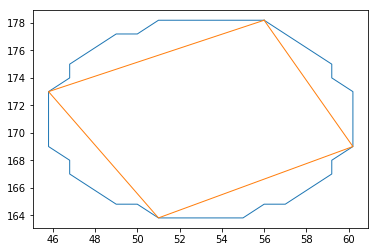

53
corners 5


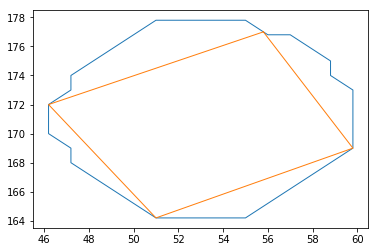

image 87
59
corners 5


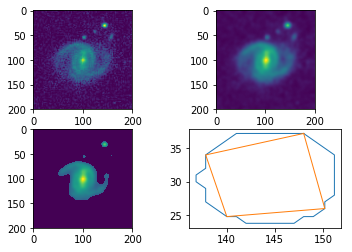

51
corners 6


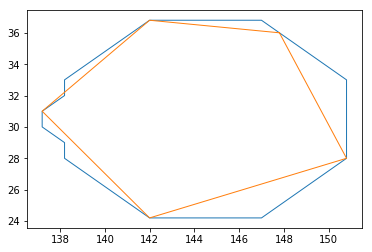

73
corners 6


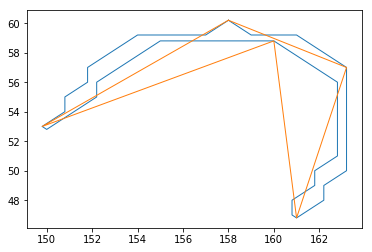

413
corners 19


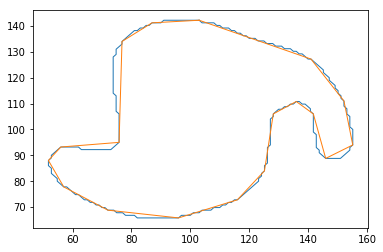

405
corners 19


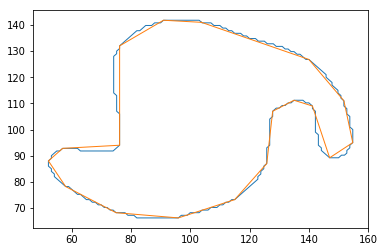

99
corners 5


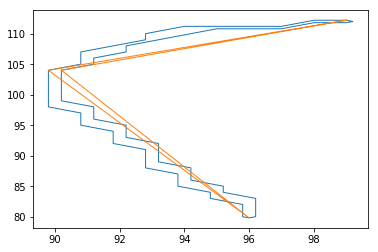

79
corners 4


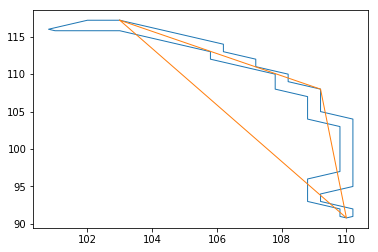

image 88
391
corners 12


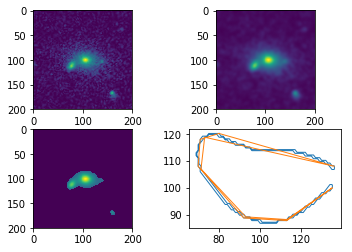

57
corners 5


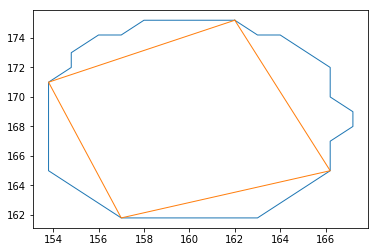

49
corners 5


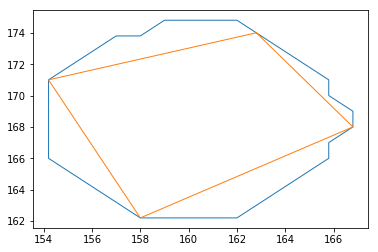

image 89
55
corners 6


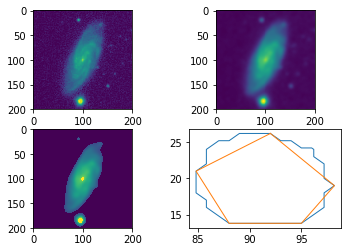

47
corners 5


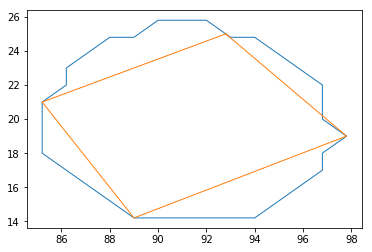

435
corners 13


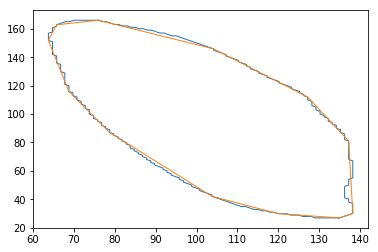

427
corners 13


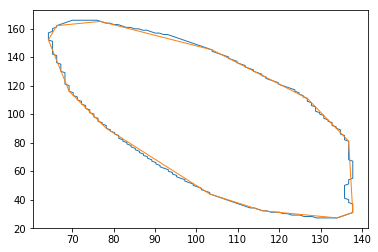

31
corners 3


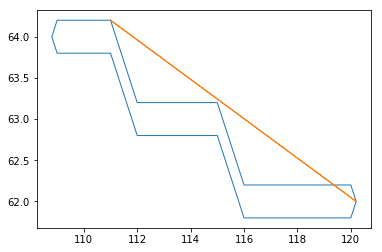

55
corners 4


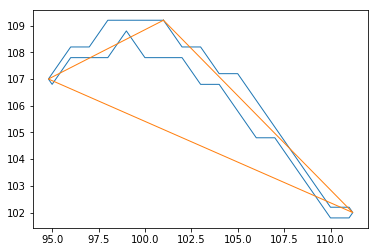

77
corners 7


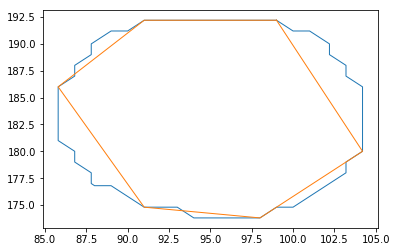

69
corners 7


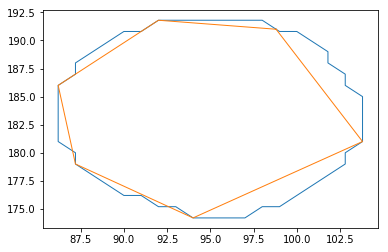

image 90
503
corners 17


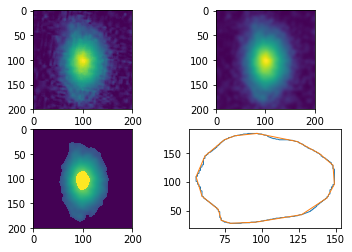

495
corners 18


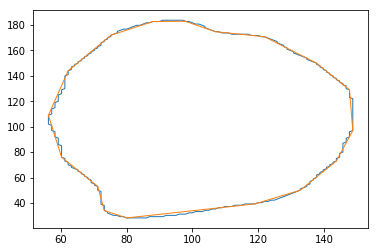

29
corners 3


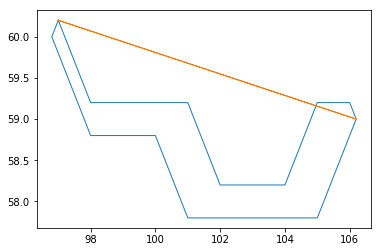

151
corners 9


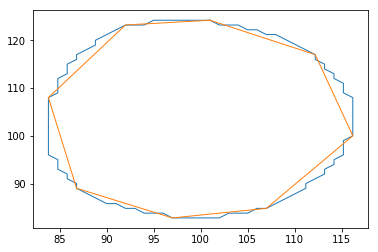

143
corners 9


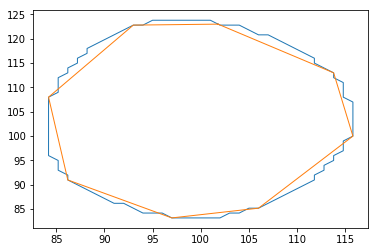

75
corners 5


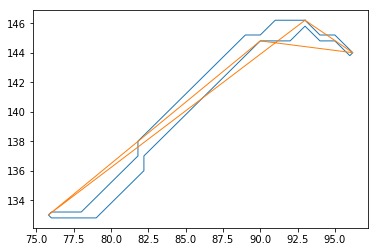

73
corners 3


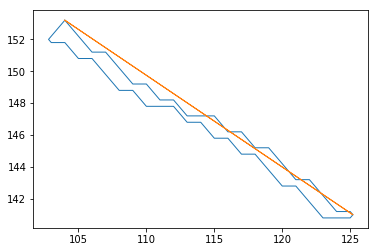

image 91
67
corners 5


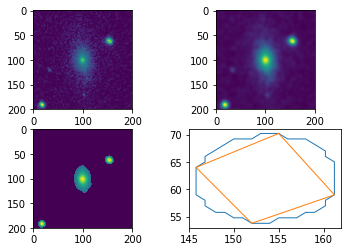

59
corners 5


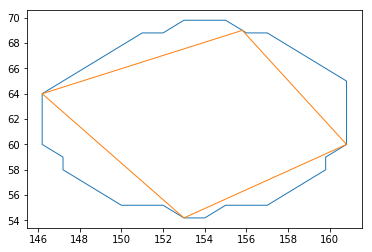

157
corners 9


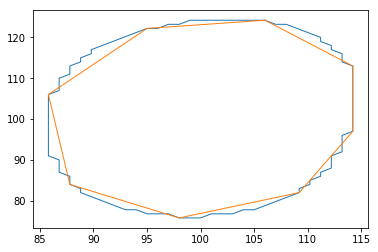

149
corners 9


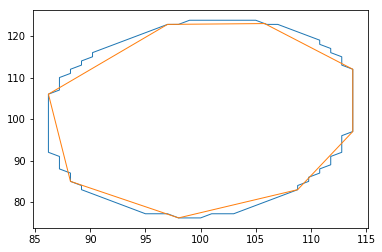

93
corners 7


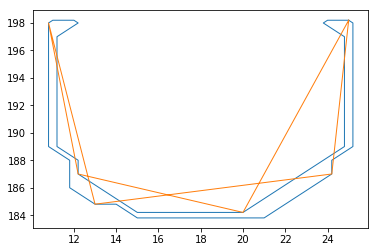

image 92
467
corners 13


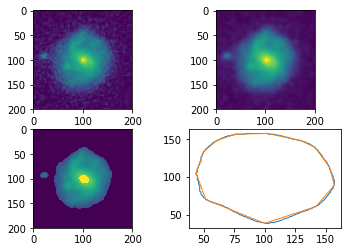

459
corners 13


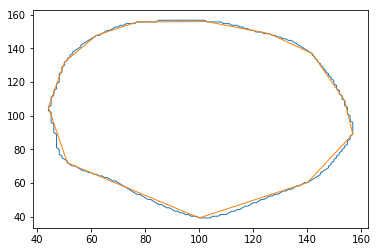

53
corners 5


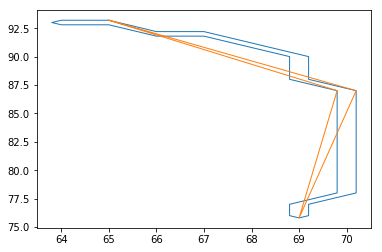

63
corners 5


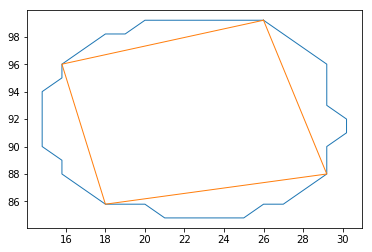

55
corners 5


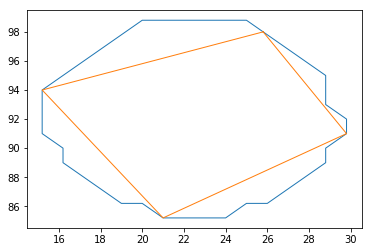

95
corners 8


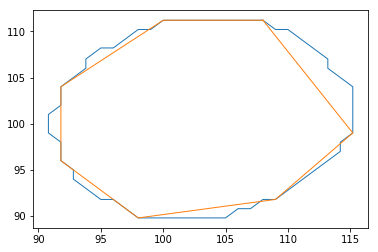

87
corners 9


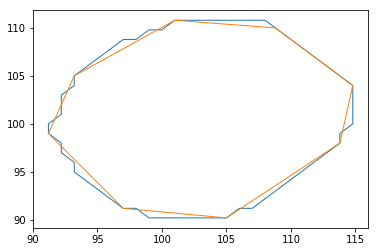

25
corners 3


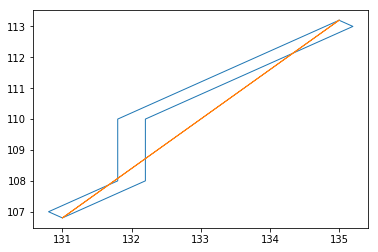

image 93
369
corners 11


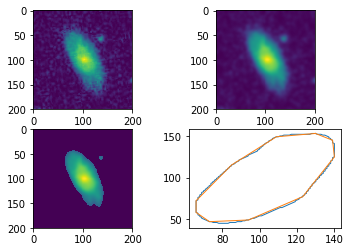

361
corners 12


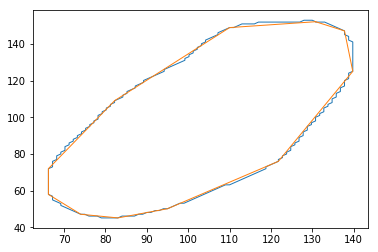

57
corners 5


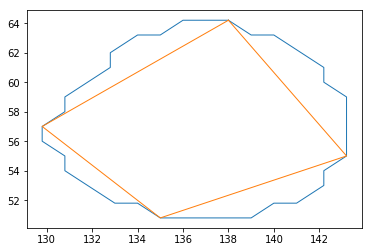

49
corners 5


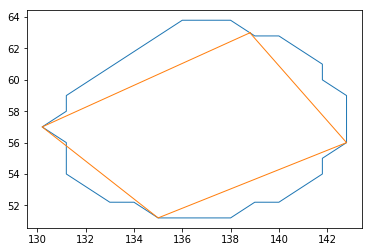

27
corners 3


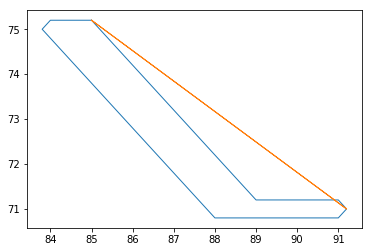

41
corners 3


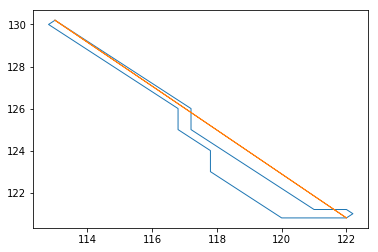

image 94
471
corners 13


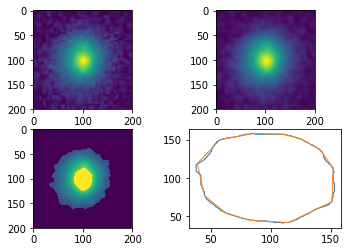

461
corners 13


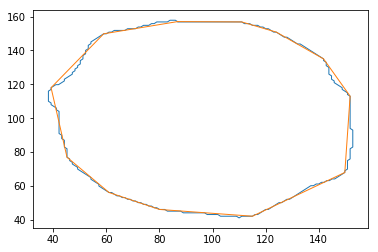

27
corners 3


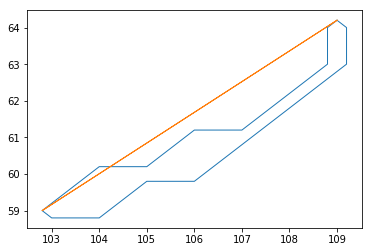

187
corners 9


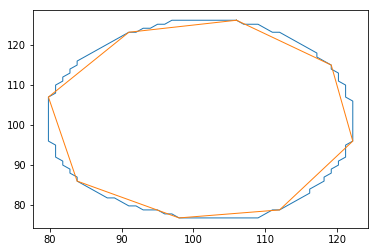

179
corners 9


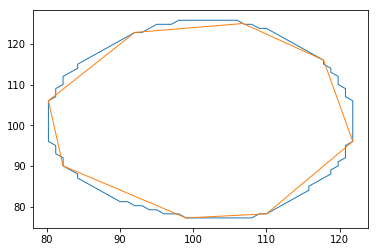

image 95
747
corners 24


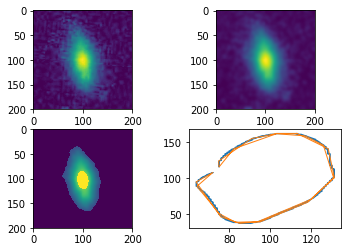

283
corners 15


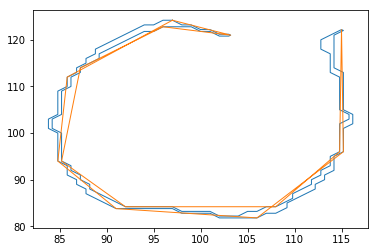

image 96
481
corners 16


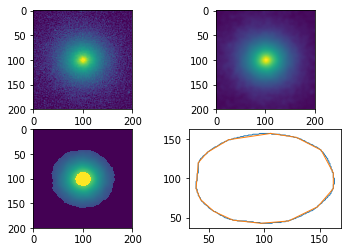

473
corners 15


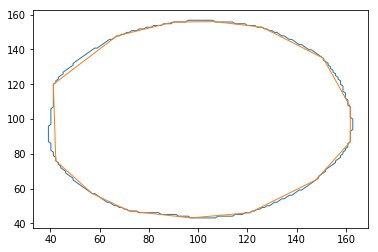

141
corners 9


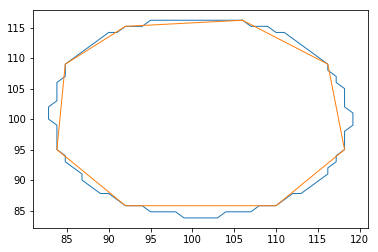

133
corners 9


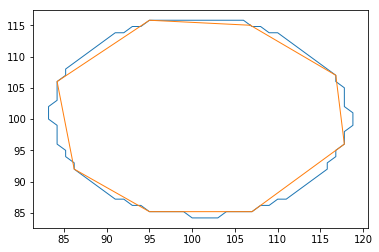

image 97
415
corners 12


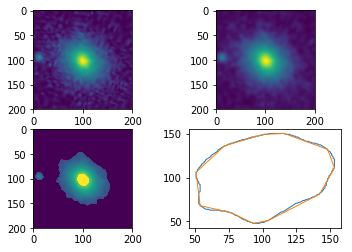

407
corners 12


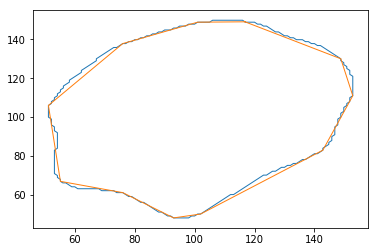

67
corners 6


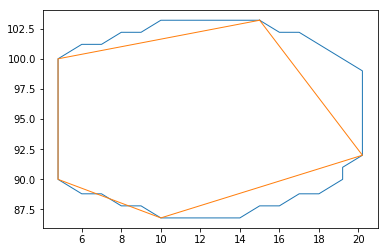

119
corners 9


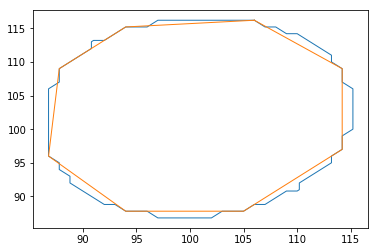

59
corners 5


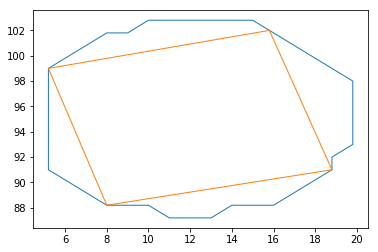

111
corners 9


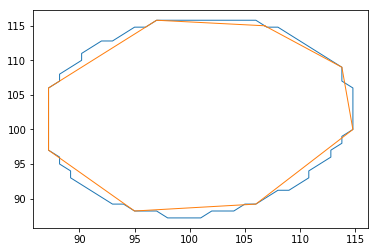

image 98
339
corners 13


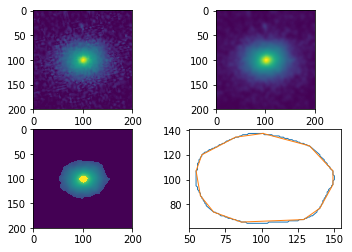

331
corners 12


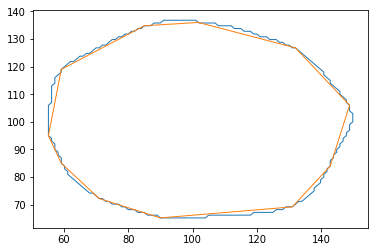

89
corners 7


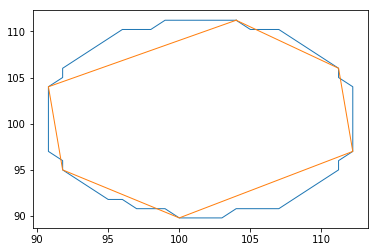

81
corners 7


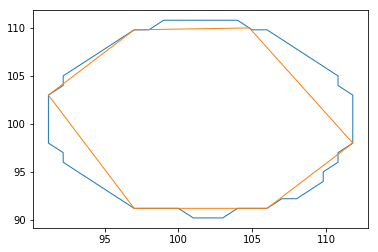

image 99
485
corners 13


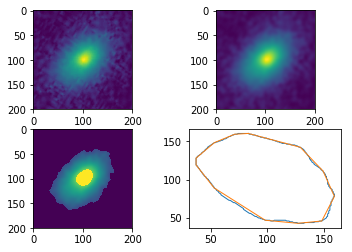

477
corners 14


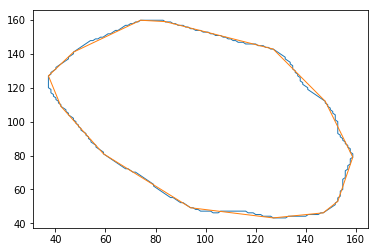

157
corners 9


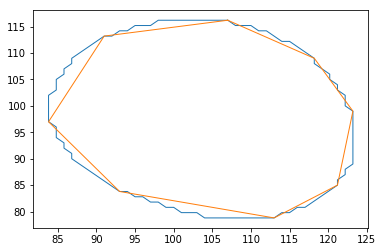

149
corners 8


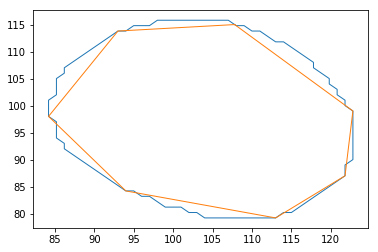

33
corners 4


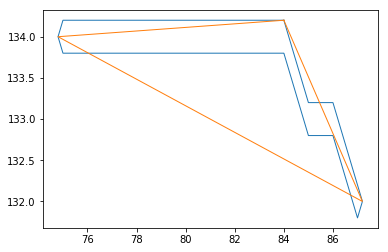

image 100
751
corners 27


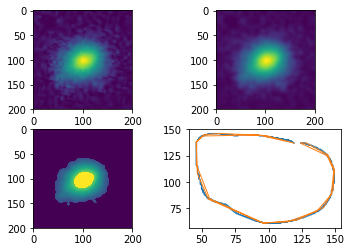

175
corners 9


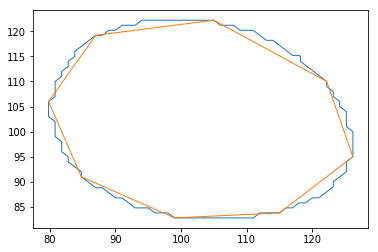

167
corners 9


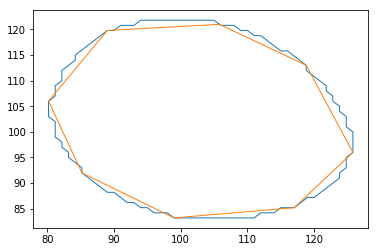

In [321]:

def treatImage(img):
    
    #image originale
    f = plt.figure()
    f.add_subplot(221)
    plt.imshow(img)
    
    #application du filtre gaussien pour réduire les artefacts
    gaussfiltered = filters.gaussian(img, sigma=3.0)
    f.add_subplot(222)
    plt.imshow(gaussfiltered)
    
    #enlèvement du bruit sur le fond noir
    im = np.where(np.logical_and(0<=gaussfiltered, gaussfiltered<=40), 0, gaussfiltered)
    #im = np.where(np.logical_and(80<=im, im<=120), 100, im)
    im = np.where(np.logical_and(140<=im, im<=255), 180, im)
    
    f.add_subplot(223)
    plt.imshow(im)
    
    #fd, hog_image = feature.hog(im, orientations=8, pixels_per_cell=(16, 16), cells_per_block=(1, 1), visualise=True)

    #fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(8, 4), sharex=True, sharey=True)
    
    
    #detection des rebords
    edges = feature.canny(im, sigma=6)
    #edges = feature.canny(im, sigma=6.0, low_threshold=0.55, high_threshold=0.8)
    contours = measure.find_contours(edges, level=0.8, fully_connected="high")
    contours = [c for c in contours if len(c) >= 20]
    #edges2 = img_as_ubyte(edges)
    #img, contours, _ =   cv.findContours(edges2,cv2.RETR_LIST,cv2.CHAIN_APPROX_SIMPLE)
    #print(_)
    #cnt = contours[0]
    #for c in cnt:
    #    print(cv2.arcLength(cnt, True))
    
    f.add_subplot(224)
    #plt.imshow(corners)
    
    #lengths = np.array( [arclength(line) for line in contours] )
    #print(lenghts)
    
    
    for cnt in contours:
        print(len(cnt))
        sprite = Image.fromarray(cnt)
        coords = approximate_polygon(cnt, tolerance=3)
        plt.plot(cnt[:, 1], cnt[:, 0], linewidth=1)
        plt.plot(coords[:,1], coords[:,0], linewidth=1)
        #corners = cv2.goodFeaturesToTrack(sprite, 7, 0.05, 25)
        print("corners",coords.shape[0])
        #plt.plot(corners[:,1], corners[:,0],linewidth=1)
        plt.show()

#mise en tons de gris
def grayscaleImages(matrix):
    len = matrix.shape[0]
    print("len", len)
    x_grayed = np.zeros((len, matrix[0].shape[1], matrix[0].shape[2]),dtype=np.uint8)
    for i in range(0,len):
        print("image", i+1)
        image = matrix[i].reshape( matrix[i].shape[1], matrix[i].shape[2], 3)
        imageGray = np.dot(image[...,:3], [0.299, 0.587, 0.114])
        treatImage(imageGray)
        imageGray = imageGray.reshape(1,matrix[i].shape[1], matrix[i].shape[2])
        x_grayed[i] = imageGray
        #plt.imshow(imageGray)
        #plt.show()
    return x_grayed
    
x_grayed = grayscaleImages(x_cropped)




##test, ne donne pas grand chose
#def meanImagePrimitive(image):
#    mean = image.mean(axis=0).mean()
#    mean = image.mean(axis=1).mean()
#    print("mean: - ", mean)



def showImages(matrix):
    len = matrix.shape[0]
    for i in range(0,len):
        image = matrix[i].reshape(matrix[i].shape[1], matrix[i].shape[2], 3)
        image = image.astype(np.uint8)
        meanImagePrimitive(image)
        #treatImage(image)
        plt.imshow(image)
        plt.show()

#showImages(x_cropped)


In [303]:
#7 et #8
X_train_binary = np.zeros((70, 424, 424),dtype=int) # matrice X_train_binary avec 35 de chaque classe
X_train_plot = np.zeros((70, 2),dtype=int)          # matrice X_train_plot qui contient le nombre de pixels noirs (X[n][0]) et blancs(X[n][1])
countBinary = 0
for xtrain in X_train :
    image = X_train[countBinary].reshape(424, 424, 3)
    imageGray = np.dot(image[...,:3], [0.299, 0.587, 0.114])
    imageGray = imageGray.reshape(1,424,424)
    
    for i in range(0,423):   # passe au travers de chaque pixel
        for j in range(0,423):
            if imageGray[0][i][j]<50:  # si le treshold est inferieur a 50, on le considere comme noir
                X_train_binary[countBinary][i][j] = 0
                X_train_plot[countBinary][0] += 1   # incremente le compte pour les pixels noirs
            else :                     # sinon, on le considere comme blanc
                X_train_binary[countBinary][i][j] = 1
                X_train_plot[countBinary][1] += 1   # incremente le compte pour les pixels blancs
    countBinary += 1

NameError: name 'X_train' is not defined

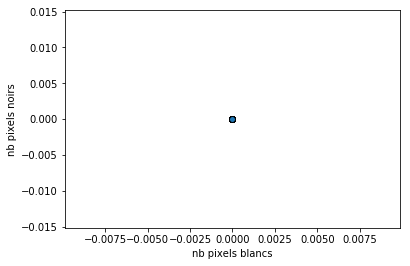

In [122]:
#9
from matplotlib.colors import ListedColormap
cm = plt.cm.RdBu
graph = plt.scatter(X_train_plot[:,1], X_train_plot[:,0], edgecolors='k')
plt.xlabel('nb pixels blancs')
plt.ylabel('nb pixels noirs')
plt.show()